# Gender classification and landmark detection in celebrity face images
Applied Machine Learning for Computer Vision

João Carlos Ramos Gonçalves de Matos

June 13, 2022

# 📋 Table of Contents<a name="top"></a>

[Setup](#setup)

[Classes & Functions](#dev)

1. [Dataset](#dataset)

2. [Image Transforms](#transforms)

3. [Evaluation Metrics](#metrics)

4. [Visualizations](#viz)

5. [Models](#models)

6. [Trainer](#trainer)

7. [Tester](#tester)

8. [Inference Time](#time)

[Run Clases & Functions for Check](#baseline)

1. [Single-task 1 - Gender classification](#single1)

2. [Single-task 2 - Face Landmarks Regression](#single2)

3. [Multi-Task Setting](#multi_task)

4. [Self-Attention Improvement Approach](#improvements)

[Experiments](#experiments)

1. [Different Optimizers](#exp1)

2. [Different Losses](#exp2)

3. [Different Losses' Weights](#exp3)

4. [Different dk values](#exp4)

5. [50 Epochs Setting](#exp5)

[Final Testing](#testing)

1. [Single-task 1 - Gender classification](#test1)

2. [Single-task 2 - Face Landmarks Regression](#test2)

3. [Multi-Task Setting](#test3)

4. [Self-Attention Improvement Approach](#test4)


## ⚙️ **Setup**<a name="setup"></a>
[(back to top)](#top)

In [1]:
import numpy as np 
import pandas as pd 
from numpy import random
import seaborn as sb
import matplotlib.pyplot as plt
import os
import sys

from torchvision import transforms
from torchvision.datasets.vision import VisionDataset
import PIL
from skimage import transform

from tqdm.notebook import tqdm

import torch
import torchvision.models as models
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.nn.functional as F
import copy

from catalyst.contrib.losses.wing import WingLoss

from sklearn.metrics import accuracy_score, roc_auc_score, recall_score, precision_score
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.metrics import roc_curve, RocCurveDisplay, auc

from scipy.integrate import simps

%matplotlib inline
%config InlineBackend.figure_format='retina'

from IPython.display import FileLink

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Load my Packages
sys.path.insert(1, '/kaggle/input/celeba-mini/Project')
from celebamini import CelebAMini
from transforms import Rescale, CenterCrop, ToTensor, Normalize

## 💻 Classes & Functions <a name="dev"></a>
### Dataset <a name="dataset"></a>
[(back to top)](#top)

In [2]:
class CelebAMini(VisionDataset):
    """
    CelebA-mini is a subsample of the CelebA dataset 
    (<http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html>)
    
    Args: 
        root (string): Root directory where the celeba-mini directory is
        transform (callable, optional): Input image transforms
        target_transform (callable, optional): Transform functions for the targets
        mode (string, optional): Mode to define the subset to load
    Dataset:
        2-tuple with:
         - sample: The input image (PIL.Image)
         - target: 2-tuple with:
           - gender: 0 for female, 1 for male
           - landmarks: 10x1 Tensor with:
             [0]: left eye x coordinate
             [1]: left eye y coordinate
             [2]: right eye x coordinate
             [3]: right eye y coordinate
             [4]: nose x coordinate
             [5]: nose y coordinate
             [6]: left mouth x coordinate
             [7]: left mouth y coordinate
             [8]: right mouth x coordinate
             [9]: right mouth y coordinate
    """

    base_folder = 'celeba-mini'
    img_folder = 'images'
    
    def __init__(self, root,
                 transform = None,
                 target_transform = None,
                 mode='train') :
        
        super(CelebAMini,self).__init__(root, transform=transform, 
                                        target_transform=target_transform)       

        self.mode = mode

        # check the mode is correct
        if mode not in ['train', 'val', 'test', 'all-train']:
            raise ValueError("Mode must be either 'train', 'val', 'test', or 'all-train'.")
        else:
            mode_name = '-' + mode # to append to file name

        # csv accordingly to mode
        self.csv_filename = f"celeba-mini{mode_name}.csv"

        #check the paths
        csv_path = os.path.join(self.root, self.base_folder, self.csv_filename)
        self.img_path = os.path.join(self.root, self.base_folder, self.img_folder)
        if not (os.path.isfile(csv_path) and os.path.isdir(self.img_path)):
            raise RuntimeError(f"Dataset not found in '{self.root}'.")
        

        #load the csv data
        csv_data = pd.read_csv(csv_path, header=0, engine='python', index_col=0)
        
        self.filename = csv_data.index.values
        self.gender = torch.as_tensor(csv_data.iloc[:,0].values)
        self.landmarks = torch.as_tensor(csv_data.iloc[:, 1:].values)
        
        #verify images exist
        for f in self.filename:
            this_path = os.path.join(self.img_path, f)
            if not os.path.isfile(this_path):
                raise RuntimeError(f"Dataset corruption: Image '{this_path}' not found.")
    
    def __len__(self) :
        return len(self.filename)
    
    def __getitem__(self, index):
        X = PIL.Image.open(os.path.join(self.img_path, self.filename[index]))

        if self.transform is not None:

            input_transform = {'image': np.array(X), 'landmarks': self.landmarks[index,:].numpy().reshape(-1, 2)}
            output_transform = self.transform(input_transform)
            X = output_transform['image']
            T = (self.gender[index], output_transform['landmarks'].reshape(-1) / X.size(1))
            
            # binary images with landmarks
            Z = torch.zeros((5, X.size(1), X.size(2)))

            for i, img in enumerate(Z):
                y = np.round(T[1][i*2].item() * X.size(1)).astype(int)
                x = np.round(T[1][i*2+1].item() * X.size(1)).astype(int)
                img[x,y] = 1

            #Z = transforms.GaussianBlur(7, sigma=2)(Z)

        else:
            T = (self.gender[index], self.landmarks[index,:])

        return X, T, Z                         

### Image Transforms <a name="transforms"></a>
[(back to top)](#top)

In [3]:
# based on https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#transforms
class Rescale(object):
    """Rescale the image in a sample to a given size.

    Args:
        output_size (tuple or int): Desired output size. If tuple, output is
            matched to output_size. If int, smaller of image edges is matched
            to output_size keeping aspect ratio the same.
    """

    def __init__(self, output_size):
        assert isinstance(output_size, (int, tuple))
        self.output_size = output_size

    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']

        h, w = image.shape[:2]
        if isinstance(self.output_size, int):
            if h > w:
                new_h, new_w = self.output_size * h / w, self.output_size
            else:
                new_h, new_w = self.output_size, self.output_size * w / h
        else:
            new_h, new_w = self.output_size

        new_h, new_w = int(new_h), int(new_w)

        img = transform.resize(image, (new_h, new_w))

        # h and w are swapped for landmarks because for images,
        # x and y axes are axis 1 and 0 respectively
        landmarks = landmarks * [new_w / w, new_h / h]

        return {'image': img, 'landmarks': landmarks}


class CenterCrop(object):
    """Crop the image in a sample, at the center

    Args:
        output_size (tuple or int): Desired output size. If int, square crop
            is made.
    """

    def __init__(self, output_size):
        assert isinstance(output_size, (int, tuple))
        if isinstance(output_size, int):
            self.output_size = (output_size, output_size)
        else:
            assert len(output_size) == 2
            self.output_size = output_size

    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']

        h, w = image.shape[:2]
        new_h, new_w = self.output_size

        top = (h - new_h) // 2
        left = (w - new_w) // 2

        image = image[top: top + new_h,
                      left: left + new_w]

        landmarks = landmarks - [left, top]

        return {'image': image, 'landmarks': landmarks}


class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):
        image, landmarks = sample['image'], sample['landmarks']

        # swap color axis because
        # numpy image: H x W x C
        # torch image: C x H x W
        image = image.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image),
                'landmarks': torch.from_numpy(landmarks)}
    
class Normalize(object):
    """Normalizes the image with respect to mean and std from ImageNet dataset"""
    
    def __init__(self, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
        self.mean, self.std = mean, std
        
        assert (len(self.mean) == 3)
        assert isinstance(mean, list)
        assert (len(self.std) == 3)
        assert isinstance(std, list)


    def __call__(self, sample):

        tr = transforms.Normalize(mean=self.mean, std=self.std)
        
        sample['image'] = tr(sample['image'])
        
        return sample

### Evaluation Metrics <a name="metrics"></a>
[(back to top)](#top)

NME Metric for Landmarks: https://arxiv.org/pdf/1911.10572.pdf

In [4]:
def list_diff(list1, list2):

    difference = []

    for list1_i, list2_i in zip(list1, list2):
        difference.append(list1_i - list2_i)
    
    return difference

# unit test
assert(list_diff([37,23], [31,7]) == [6, 16])

In [5]:
class NME(object):
    """Computer the normalized mean errors"""
    def __init__(self, gt, pred):

        self.gt_coords = {'L_eye':   (gt[0], gt[1]),
                          'R_eye':   (gt[2], gt[3]),
                          'nose':    (gt[4], gt[5]),
                          'L_mouth': (gt[6], gt[7]),
                          'R_mouth': (gt[8], gt[9])}
        
        self.pred_coords = {'L_eye':  (pred[0], pred[1]),
                           'R_eye':   (pred[2], pred[3]),
                           'nose':    (pred[4], pred[5]),
                           'L_mouth': (pred[6], pred[7]),
                           'R_mouth': (pred[8], pred[9])}
        
        self.inter_ocular_dist = np.linalg.norm(list_diff(self.gt_coords['R_eye'], self.gt_coords['L_eye']))
    
    def _get1(self, gt_coord, pred_coord): # in percentage
        return np.linalg.norm(list_diff(gt_coord, pred_coord)) / self.inter_ocular_dist * 100
        
    def getAll(self):
        
        self.nmes = dict()
        
        # individual points
        for (ldmrk, gt_coord), (_, pred_coord) in zip(self.gt_coords.items(), self.pred_coords.items()):
            self.nmes[ldmrk] = self._get1(gt_coord, pred_coord)
       
        return self.nmes
    
    def getMetric(self, metric):
        
        if metric in self.gt_coords.keys():
            return self._get1(self.gt_coords[metric], self.pred_coords[metric])
        
        elif metric == 'FR': # failure rate at 10%
            self.getAll()
            
            return np.mean([1 if m >= 10 else 0 for m in self.nmes.values() ])
        
        elif metric == 'reg_curve':
            self.getAll()
            
            vals = []
            # run over each threshold, from 0 to 1
            for i in range(100):
                vals.append(1 - np.mean([1 if m >= i else 0 for m in self.nmes.values() ]))
            
            return vals
                
        elif metric == 'mean':
            
            self.getAll()
            
            return sum(self.nmes.values()) / len(self.nmes)
        
        elif metric == 'std':
            
            self.getAll()
            
            # std of all points
            listr = []
            for v in self.nmes.values():
                listr.append(v)

            return np.std(listr) 
        
def NME_metric_from_batch(gts, preds, metric):
    
    if isinstance(gts, torch.Tensor):
        gts = gts.cpu().detach().numpy()
        
    if isinstance(preds, torch.Tensor):
        preds = preds.cpu().detach().numpy()
    
    mean_val = []
    
    for gt, pred in zip(gts, preds):
        nme = NME(gt, pred)
        mean_val.append(nme.getMetric(metric))
      
    if metric == 'reg_curve':
        return np.mean(mean_val, axis=0)  
    else:
        return np.mean(mean_val) 

In [6]:
class MetricTracker(object):
    """Computes and stores the average and current value of a certain metric"""
    def __init__(self, metric_func, metric_name=None):
        self.reset()
        self.metric_func = metric_func
        self.metric_name = metric_name
    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, gt, pred, n=1):
        if self.metric_name == None:
            self.val = self.metric_func(gt, pred)
            
        else:
            self.val = self.metric_func(gt, pred, self.metric_name)
            
        self.sum += self.val * n
        self.count += n
        self.avg = self.sum / self.count

In [7]:
class Evaluator(object):
    """Computes and Saves all metrics related to a task"""
    def __init__(self, task='gender'):
        
        self.task = task

        if self.task not in ['gender', 'landmarks', 'multi_task']:
            raise AttributeError("Task must be 'gender', 'landmarks', or 'multi_task'.")
        
        # multi_task has all the metrics
        if self.task in ['gender', 'multi_task']:
            # metrics of interest for Gender Classification Task
            self.accuracy     = MetricTracker(accuracy_score)
            self.recall       = MetricTracker(recall_score)
            self.precision    = MetricTracker(precision_score)
            self.f1_score     = MetricTracker(f1_score)
            self.conf_matrix  = MetricTracker(confusion_matrix)
            self.auc_roc      = MetricTracker(roc_auc_score)
            
        if self.task in ['landmarks', 'multi_task']:
            # metrics of interest for Face Landmarks Regression
            self.L_eye_NME   = MetricTracker(NME_metric_from_batch, metric_name='L_eye')
            self.R_eye_NME   = MetricTracker(NME_metric_from_batch, metric_name='R_eye')
            self.nose_NME    = MetricTracker(NME_metric_from_batch, metric_name='nose')
            self.L_mouth_NME = MetricTracker(NME_metric_from_batch, metric_name='L_mouth')
            self.R_mouth_NME = MetricTracker(NME_metric_from_batch, metric_name='R_mouth')
            self.mean_NME    = MetricTracker(NME_metric_from_batch, metric_name='mean')
            self.std_NME     = MetricTracker(NME_metric_from_batch, metric_name='std')
            self.FR_NME      = MetricTracker(NME_metric_from_batch, metric_name='FR')
        
        self.reset()
            
        
    def reset(self):
        # reset all metrics
        if self.task in ['gender', 'multi_task']:

            self.accuracy.reset()
            self.recall.reset()
            self.precision.reset()
            self.f1_score.reset()
            self.conf_matrix.reset()
            self.auc_roc.reset()
            
        if self.task in ['landmarks', 'multi_task']:

            self.L_eye_NME.reset()
            self.R_eye_NME.reset()
            self.nose_NME.reset()
            self.L_mouth_NME.reset()
            self.R_mouth_NME.reset()
            self.mean_NME.reset()   
            self.std_NME.reset()  
            self.FR_NME.reset()
    
    def get_gt_pred_proba(self, gt, pred):
                   
        gt = gt.cpu().detach().numpy()[:,1]
        proba = F.softmax(pred, dim=1).cpu().detach().numpy()[:,1]
        pred = torch.max(pred,1)[1].cpu().detach().numpy()
        
        return gt, proba, pred
    
    def get_reg_curve(self, gt, pred):
                
        vals = NME_metric_from_batch(gt, pred, metric='reg_curve')
        # calculate the area under the curve
        area = simps(vals, dx=1)
        
        return vals, area
        
    
    def update(self, gts, preds, n=1):
        # update all metrics
        
        if self.task in ['gender', 'multi_task']:
            
            if self.task == 'multi_task':
                gt, proba, pred = self.get_gt_pred_proba(gts[0], preds[0])
                
            elif self.task == 'gender':
                gt, proba, pred = self.get_gt_pred_proba(gts, preds)

            # AUC ROC uses the probabilities
            self.auc_roc.update(gt, proba, n=1)
            
            # Transform probabilities into labels
            self.accuracy.update(gt, pred, n=1)
            self.recall.update(gt, pred, n=1)
            self.precision.update(gt, pred, n=1)
            self.f1_score.update(gt, pred, n=1)
            self.conf_matrix.update(gt, pred, n=1)
        
        if self.task in ['landmarks', 'multi_task']:
            
            if self.task == 'multi_task':
                gt, pred = gts[1], preds[1]
                
            elif self.task == 'landmarks':
                gt, pred = gts, preds
            
            self.L_eye_NME.update(gt, pred, n=1)
            self.R_eye_NME.update(gt, pred, n=1)
            self.nose_NME.update(gt, pred, n=1)
            self.L_mouth_NME.update(gt, pred, n=1)
            self.R_mouth_NME.update(gt, pred, n=1)
            self.mean_NME.update(gt, pred, n=1)
            self.std_NME.update(gt, pred, n=1)
            self.FR_NME.update(gt, pred, n=1)
                      
    def get_metrics(self):
        
        if self.task in ['gender', 'multi_task']:
            g_mt = {'Accuracy': self.accuracy.avg,
                    'Recall': self.recall.avg,
                    'Precision': self.precision.avg,
                    'F1_score': self.f1_score.avg,
                    'AUC_ROC': self.auc_roc.avg}
            
            if self.task == 'gender':
                return g_mt
        
        if self.task in ['landmarks', 'multi_task']:
            l_mt = {'L_eye_NME':  self.L_eye_NME.avg,
                    'R_eye_NME':   self.R_eye_NME.avg,
                    'nose_NME':    self.nose_NME.avg,
                    'L_mouth_NME': self.L_mouth_NME.avg,
                    'R_mouth_NME': self.R_mouth_NME.avg,
                    'mean_NME': self.mean_NME.avg,
                    'std_NME': self.std_NME.avg,
                    'FR(0.1)': self.FR_NME.avg}
            
            if self.task == 'landmarks':
                return l_mt
        
        # if mult_task return dict with all
        return {**g_mt, **l_mt}
    

### Vizualizations <a name="viz"></a>
[(back to top)](#top)

In [8]:
#  We define a function to visualize a face with its associated gender and 
# landmark labels
def labeled_face_visualization(face, gender, landmarks, task='landmarks', ax = None):
    lm_marker = ['<', '>', '^', '3', '4']
    gender_txt = ['Woman', 'Man']
    
    if ax is None:
      ax = plt.gca()

    ax.imshow(face, cmap='gray')
    
    if (gender is not None) & (task == 'multi_task'):
        ax.title.set_text(gender)

    lm = landmarks.reshape(-1, 2)
    for i, m in enumerate(lm_marker):
      ax.scatter(lm[i,0], lm[i,1], marker=lm_marker[i])

### Models <a name="models"></a>
[(back to top)](#top)

In [9]:
class BaselineModel(nn.Module):
  def __init__(self, task='gender'):
    super().__init__()
    
    self.task = task
    
    # Load common backbone to be equal across all baselines
    vgg16 = models.vgg16(pretrained=True)
    self.feature_extractor = vgg16.features
    self.avg_pool = vgg16.avgpool
    self.clf = vgg16.classifier
    
    if self.task == 'gender':
        self.clf[6] = nn.Linear(in_features=4096, out_features=2, bias=True)
        
    elif self.task == 'landmarks':
        self.clf[6] = nn.Linear(in_features=4096, out_features=10, bias=True)
    
    elif self.task == 'multi_task':
        # first head is for gender
        self.clf1 = copy.deepcopy(self.clf)
        self.clf1[6] = nn.Linear(in_features=4096, out_features=2, bias=True)
        
        # second head is for landmarks
        self.clf2 = copy.deepcopy(self.clf)
        self.clf2[6] = nn.Linear(in_features=4096, out_features=10, bias=True)


  def forward(self, x):
    
    x = self.feature_extractor(x)
    x = self.avg_pool(x)
    x = torch.flatten(x, 1)
    
    if self.task in ['gender', 'landmarks']:
        return self.clf(x) 
    
    elif self.task == 'multi_task':
        return self.clf1(x), self.clf2(x)


# Unit Test

#im_test = torch.zeros((2,3,224,224)) # same sizes as a mini-batch in CIFAR10

#vgg1 = BaselineModel(task='gender')
#vgg2 = BaselineModel(task='landmarks')
#vgg3 = BaselineModel(task='multi_task')

# ensure the multi-head works & produces the same shape as in single-task
#assert(vgg1(im_test).shape == vgg3(im_test)[0].shape)
#assert(vgg2(im_test).shape == vgg3(im_test)[1].shape)

Improvement

Add 2 self-attention layers, after feature extraction, to make the FCNs for classification look at different zones of the image, depending on the task.
Based on a [Transformers' repository](https://github.com/jadore801120/attention-is-all-you-need-pytorch/tree/5c0264915ab43485adc576f88971fc3d42b10445/transformer).

[(back to top)](#top)

In [10]:
# model definition
class ScaledDotProductAttention(nn.Module):
    ''' Scaled Dot-Product Attention '''

    def __init__(self, scale):
        super().__init__()
        self.scale = scale

    def forward(self, q, k, v):

        attn = torch.matmul(q / self.scale, k.transpose(2,3))
        attn = F.softmax(attn, dim=-1)
        output = torch.matmul(attn, v).transpose(2,0)

        return output
       
# include attention layers before the classification heads        
class MultiAttentionVGG(nn.Module):
  def __init__(self, d_k=64):
    super().__init__()

    # define d_k, which is the q, k, v size and used for temperature
    self.d_k = d_k

    vgg16 = models.vgg16(pretrained=True)
    self.feature_extractor = vgg16.features
    
    # get the number of channels that gets out of VGG feature extraction (512)
    n_channels = self.feature_extractor[-3].out_channels
        
    # create W matrices, with size 512 x 64, to map 512 features into q,k,v of 64
    w_qs = nn.Linear(n_channels, self.d_k, bias=False)
    w_ks = nn.Linear(n_channels, self.d_k, bias=False)
    w_vs = nn.Linear(n_channels, self.d_k, bias=False)
    
    # create scaled dot product attention with temperature of sqrt(64)
    attn_layer = ScaledDotProductAttention(scale = self.d_k ** 0.5)
    
    # no. features we'll have after flatten = 64 x 7 x 7
    n_features_after_att = d_k * vgg16.avgpool.output_size[0] * vgg16.avgpool.output_size[1]
        
    # classification head from VGG, to be adaptaded to each task
    clf = vgg16.classifier
    
    # adapt first layer of FCN according to features that come from attention
    clf[0] = nn.Linear(in_features=n_features_after_att, out_features=4096)
    
    # one attention layer for gender
    self.w_qs1 = copy.deepcopy(w_qs)
    self.w_ks1 = copy.deepcopy(w_ks)
    self.w_vs1 = copy.deepcopy(w_vs)
    self.attn_layer1 = copy.deepcopy(attn_layer)
    
    # first head is for gender
    self.clf1 = copy.deepcopy(clf)
    self.clf1[6] = nn.Linear(in_features=4096, out_features=2, bias=True)

    # another attention layer for landmarks
    self.w_qs2 = copy.deepcopy(w_qs)
    self.w_ks2 = copy.deepcopy(w_ks)
    self.w_vs2 = copy.deepcopy(w_vs)
    self.attn_layer2 = copy.deepcopy(attn_layer)
    
    # second head is for landmarks
    self.clf2 = copy.deepcopy(clf)
    self.clf2[6] = nn.Linear(in_features=4096, out_features=10, bias=True)
    

  def forward(self, x):
    
    x = self.feature_extractor(x).transpose(1,3)

    # q, k, v will have the shape batch_size x 7 x 7 x 64
    q1 = self.w_qs1(x).view(x.size(0), x.size(1), x.size(2), self.d_k)
    k1 = self.w_ks1(x).view(x.size(0), x.size(1), x.size(2), self.d_k)
    v1 = self.w_vs1(x).view(x.size(0), x.size(1), x.size(2), self.d_k)
    
    q2 = self.w_qs2(x).view(x.size(0), x.size(1), x.size(2), self.d_k)
    k2 = self.w_ks2(x).view(x.size(0), x.size(1), x.size(2), self.d_k)
    v2 = self.w_vs2(x).view(x.size(0), x.size(1), x.size(2), self.d_k)

    # get attention output, of size 64 x 1 x batch_size, for each att head
    x1 = self.attn_layer1(q1, k1, v1)
    x2 = self.attn_layer2(q2, k2, v2) 

    # no average pooling, assuming all images have batch_size x 64 x 7 x 7
    x1 = x1.transpose(2,0).transpose(1,3)
    x2 = x2.transpose(2,0).transpose(1,3)

    # 3136 features to feed the FCs
    x1 = torch.flatten(x1, 1) 
    x2 = torch.flatten(x2, 1) 

    out1 = self.clf1(x1) 
    out2 = self.clf2(x2)
    
    return out1, out2

# Unit Test

#im_test = torch.zeros((15, 3, 224, 224)) # same sizes as a mini-batch in the dataset

#multi_att_vgg_test = MultiAttentionVGG()

#out1, out2 = multi_att_vgg_test(im_test)

#assert(out1.shape[0] == out2.shape[0] == 15)
#assert(out1.shape[1] == 2)
#assert(out2.shape[1] == 10)

### Trainer <a name="trainer"></a>
[(back to top)](#top)

In [11]:
class Trainer(object):
    def __init__(self,
                 train_dataset,
                 val_dataset,
                 batch_size,
                 n_epochs,
                 learning_rate,
                 model,
                 loss,
                 device,
                 opti='Adam',
                 lmbds=[None, None],
                 out_path='1_exp1',
                 tag='Single Task 1 Gender Classification',
                 task='gender'):
      
        # Define Dataloaders
        self.train_loader = DataLoader(train_dataset, 
                                       batch_size = batch_size,
                                       shuffle = True) 
        
        self.val_loader = DataLoader(val_dataset,
                                     batch_size = batch_size,
                                     shuffle = True)
        
        # Define model
        self.model = model

        # Define Optimizer
        
        self.opti = opti
        
        if self.opti == 'Adam':
        
            self.optimizer = torch.optim.Adam(self.model.parameters(),
                                              lr = learning_rate)
        elif self.opti == 'Adamax':
            
            self.optimizer = torch.optim.Adamax(self.model.parameters(),
                                                lr = learning_rate)
            
        elif self.opti == 'Adagrad':
            
            self.optimizer = torch.optim.Adagrad(self.model.parameters(),
                                                 lr = learning_rate)
        elif self.opti == 'RMSProp':
            
            self.optimizer = torch.optim.RMSprop(self.model.parameters(),
                                                 lr = learning_rate)

        # Define Criterion
        self.criterion = loss
        
        # Hyperparameters
        self.n_epochs = n_epochs

        # Define Evaluator
        self.evaluator = Evaluator(task=task)

        # Using GPU
        self.model.to(device)
        
        # Define Task & Tag 
        self.task = task
        self.tag = tag
        self.out_path = out_path
        print('Training Setting\n' + self.tag)
        
        # Define Lambdas to give different weights to losses in Multi-Task
        self.lmbd1 = lmbds[0]
        self.lmbd2 = lmbds[1]
        
        # Lists to save train and val losses
        self.train_losses = []
        self.val_losses = []
        
        # Best validation loss to assess the best epoch
        self.best_val_loss = np.inf
        self.best_epoch = 0

    def train(self, epoch):
        self.model.train()
        if self.task == 'multi_task':
            self.train_loss = [0.0] * 3
        else:
            self.train_loss = 0.0

        for image, target, _ in self.train_loader:
            image = image.to(device).float()

            if self.task == 'gender':
                target = F.one_hot(target[0], num_classes=2).to(device).to(torch.float32)
                
            elif self.task == 'landmarks':
                target = target[1].to(device).to(torch.float32)
 
                
            elif self.task == 'multi_task':
                target1 = F.one_hot(target[0], num_classes=2).to(device).to(torch.float32)
                target2 = target[1].to(device).to(torch.float32)
                target = (target1, target2)
                
                
            self.optimizer.zero_grad()    
            output = self.model(image)
            
            if self.task == 'multi_task':
                loss_1 = self.criterion[0](output[0], target[0])
                loss_2 = self.criterion[1](output[1], target[1])
                loss = self.lmbd1 * loss_1 + self.lmbd2 * loss_2
                
            else: 
                loss = self.criterion(output, target)
                
            loss.backward()
            self.optimizer.step()
            
            if self.task == 'multi_task':
                self.train_loss[0] += loss_1.item() / len(self.train_loader)
                self.train_loss[1] += loss_2.item() / len(self.train_loader)
                self.train_loss[2] += loss.item() / len(self.train_loader)
                
            else:
                self.train_loss += loss.item() / len(self.train_loader)
        
        # Append this epochs' loss
        self.train_losses.append(self.train_loss)


    def validation(self, epoch):
        self.model.eval()
        self.evaluator.reset()
        
        if self.task == 'multi_task':
            self.val_loss = [0.0] * 3
        else:
            self.val_loss = 0.0
        

        for image, target, _ in self.val_loader:
            image = image.to(device).float()
            
            if self.task == 'gender':
                target = F.one_hot(target[0], num_classes=2).to(device).to(torch.float32)
                
            elif self.task == 'landmarks':
                target = target[1].to(device).to(torch.float32)
                                
            elif self.task == 'multi_task':
                target1 = F.one_hot(target[0], num_classes=2).to(device).to(torch.float32)
                target2 = target[1].to(device).to(torch.float32)
                target = (target1, target2)
                

            with torch.no_grad():
                output = self.model(image)
            
            if self.task == 'multi_task':
                loss_1 = self.criterion[0](output[0], target[0])
                loss_2 = self.criterion[1](output[1], target[1])
                loss = self.lmbd1 * loss_1 + self.lmbd2* loss_2
                
                self.val_loss[0] += loss_1.item() / len(self.val_loader)
                self.val_loss[1] += loss_2.item() / len(self.val_loader)
                self.val_loss[2] += loss.item() / len(self.val_loader)
                
                
            else: 
                self.val_loss += self.criterion(output, target).item() / len(self.val_loader)
            
            
            # Update evaluator
            self.evaluator.update(target,
                                  output,
                                  n=len(self.val_loader))
            
        # save this model if it is the best epoch so far
        if self.task == 'multi_task':
            curr_loss = self.val_loss[2]
        else:
            curr_loss = self.val_loss

        if curr_loss < self.best_val_loss:
            self.best_val_loss = curr_loss
            self.save_model(self.out_path + '.pth')                
            self.best_epoch = epoch

        # Metrics Assessment in Valiation        
        self.metrics_dict = self.evaluator.get_metrics()
        # Print this epoch's results
        self._print_loss_metrics(epoch)
        
        # Append this epochs' loss
        self.val_losses.append(self.val_loss)
        
    def _print_loss_metrics(self, epoch):
        
        if self.task == 'multi_task':
            str_print = f"\nEpoch [{epoch+1:02d}/{self.n_epochs:02d}]  Train CEL {self.train_loss[0]:.4f} | Train L1 {self.train_loss[1]:.4f} \
 | Train Loss {self.train_loss[2]:.4f} |  Val CEL {self.val_loss[0]:.4f} | Val L1 {self.val_loss[1]:.4f} | Val Loss {self.val_loss[2]:.4f}"
            
        else:
            str_print = f"Epoch [{epoch+1:02d}/{self.n_epochs:02d}]  Train Loss {self.train_loss:.4f} | Val Loss {self.val_loss:.4f}"
        
        for key, val in self.metrics_dict.items():
            str_print += f" | {key} {val:.3f}"
            
        print(str_print)
        
        
    def plot_losses(self):
        
        epochs = np.arange(self.n_epochs)

        plt.figure(figsize=(8,4))
        
        if self.task == 'multi_task':
            plt.plot(epochs, [i[0] for i in self.train_losses], label='CE Train Loss')
            plt.plot(epochs, [i[1] for i in self.train_losses], label='L1 Train Loss')
            plt.plot(epochs, [i[2] for i in self.train_losses], label='Train Loss')
            plt.plot(epochs, [i[0] for i in self.val_losses], label='CE Val Loss')
            plt.plot(epochs, [i[1] for i in self.val_losses], label='L1 Loss')
            plt.plot(epochs, [i[2] for i in self.val_losses], label='Val Loss')
            
        else:
            plt.plot(epochs, self.train_losses, label='Training Loss')
            plt.plot(epochs,self.val_losses, label='Validation Loss')
            
        plt.plot([self.best_epoch], [self.best_val_loss], marker='o', color='k', label='Best Epoch')
        plt.legend(loc='upper right')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.xticks(epochs)
        plt.title('Learning Curves in ' + self.tag)
        plt.show()
        
    def save_model(self, path):
        torch.save(self.model.state_dict(), path)
        # link to download the model state dict
        
        

### Tester <a name="tester"></a>
[(back to top)](#top)

In [12]:
class Tester(object):
    def __init__(self,
                 test_dataset,
                 model,
                 device,
                 tag,
                 task='gender'):
      
        # Define Dataloader 
        self.test_loader = DataLoader(test_dataset, 
                                       batch_size = len(test_dataset),
                                       shuffle = True) 
        
        # Define model
        self.model = model

        # Define Evaluator
        self.evaluator = Evaluator(task=task)

        # Using GPU
        self.model.to(device)
        
        # Define Task & Tag
        self.task = task
        self.tag = tag
        print("Testing Setting\n" + self.tag)
        
    def test(self):
        self.model.eval()
        self.evaluator.reset()

        for image, target, _ in self.test_loader:
            image = image.to(device).float()

            if self.task == 'gender':
                target = F.one_hot(target[0], num_classes=2).to(device).to(torch.float32)
                
            elif self.task == 'landmarks':
                target = target[1].to(device).to(torch.float32)
                
            elif self.task == 'multi_task':
                target1 = F.one_hot(target[0], num_classes=2).to(device).to(torch.float32)
                target2 = target[1].to(device).to(torch.float32)
                target = (target1, target2)   
                
            with torch.no_grad():
                output = self.model(image)
                        
            # Update evaluator
            self.evaluator.update(target,
                                  output,
                                  n=len(self.test_loader))
            

        # Metrics Assessment in Valiation        
        self.metrics_dict = self.evaluator.get_metrics()
        # Print this epoch's results
        self._print_loss_metrics()
        

        self.gt = target
        self.pred = output
        self.images = image
        
        
    def _print_loss_metrics(self):

        str_print = f"\n[Full Test]"
        
        for key, val in self.metrics_dict.items():
            str_print += f"\t{key} {val:.4f}"
            
        print(str_print)
        
    def plot_conf_matrix(self):
    
        # get confusion matrix
        cf_matrix = self.evaluator.conf_matrix.val

        plt.figure(figsize=[6,4])

        # plot matrix
        ax = sb.heatmap(cf_matrix, annot=cf_matrix, fmt='', cmap='YlOrBr')

        ax.set_title('Confusion Matrix ' + self.tag +'\n')
        ax.set_xlabel('\nPredicted Class')
        ax.set_ylabel('Actual Class')
        
        ax.set_xticklabels(['Woman', 'Man'])
        ax.set_yticklabels(['Woman', 'Man'])

        ## Display the visualization of the Confusion Matrix
        print('\n')
        plt.show()
        
    def plot_roc_curve(self):
        
        if self.task == 'multi_task':
            gt, proba, pred = self.evaluator.get_gt_pred_proba(self.gt[0], self.pred[0])
        else:
            gt, proba, pred = self.evaluator.get_gt_pred_proba(self.gt, self.pred)
        
        fpr, tpr, _ = roc_curve(gt, proba) 
        roc_auc = self.evaluator.auc_roc.val
        display = RocCurveDisplay(fpr=fpr, tpr=tpr)
        display.plot()
        plt.title('ROC Curve ' + self.tag)
        plt.legend([f"AUC = {roc_auc:.4f}"])
        plt.show()
        
    def plot_reg_curve(self):
        
        if self.task == 'multi_task':
            vals, area = self.evaluator.get_reg_curve(self.gt[1], self.pred[1])
        else:
            vals, area = self.evaluator.get_reg_curve(self.gt, self.pred)
            
        plt.figure(figsize=[6,4])
        plt.plot(list(range(100)), vals, label=f'AUC = {area:.2f}')
        plt.title('Landmark Regression Operation Curve')
        plt.ylabel('Success Rate')
        plt.xlabel('NME Threshold (%)')
        plt.legend()
        plt.show()
        
    def plot_examples(self, invTrans):
        
        if self.task == 'gender':
        
            gt, proba, pred = self.evaluator.get_gt_pred_proba(self.gt, self.pred)
            pred = pred.astype('int')
            gt = gt.astype('int')
            # convert probabilities to confidences
            proba = [1-i if i <.5 else i for i in proba]

            if self.task == 'gender':
                # get positions where there is a misclassification
                bad_mask = [i for i, (g, p) in enumerate(zip(gt, pred)) if g != p]
                labels = ['Woman', 'Man']

            print('Poorly Classified Examples on top and Well Classified Examples on bottom')
            # first plot n bad images, up to 5

            if len(bad_mask) > 5:
                bad_mask = bad_mask[:5]

            fig, axs = plt.subplots(1, len(bad_mask), figsize=(18,32))
            for k, i in enumerate(bad_mask):
                axs[k].imshow(invTrans(self.images[i]).permute(1,2,0).cpu().numpy())
                axs[k].set_title(f"Pred: {labels[pred[i]]}, GT: {labels[gt[i]]}\nConf: {proba[i]:.2f}")
                axs[k].axis("off")

            # then plot 5 good images
            good_mask = [i for i in range(len(self.images)) if i not in bad_mask][:5]

            fig, axs = plt.subplots(1, len(good_mask), figsize=(18,32))
            for k, i in enumerate(good_mask):
                axs[k].imshow(invTrans(self.images[i]).permute(1,2,0).cpu().numpy())
                axs[k].set_title(f"Pred: {labels[pred[i]]}, GT: {labels[gt[i]]}\nConf: {proba[i]:.2f}")
                axs[k].axis("off")
            
        
        elif self.task in ['landmarks', 'multi_task']:
            
            if self.task == 'multi_task':
                #landmarkss = self.pred[1]
                labels = ['Woman', 'Man']
                gt, proba, pred = self.evaluator.get_gt_pred_proba(self.gt[0], self.pred[0])
                pred = pred.astype('int')
                gt = gt.astype('int')
                # convert probabilities to confidences
                proba = [1-i if i <.5 else i for i in proba]
            
            # We randomize an index to select some few random samples for visualization
            view = random.permutation(len(self.images))

            # Subplots:
            rows = 2
            cols = 5
            size_each = 3

            fig, axes = plt.subplots(rows*2, cols,figsize =(cols*size_each, rows*2*size_each + 2) )

            # Remove the plot axis
            for ax in axes.reshape(-1):
              ax.axis('off')

            counter = 0
            for r in range(rows):
              for c in range(cols):
                
                face = invTrans(self.images[view[counter]]).to(device).float()
                
                if self.task == 'multi_task':
                    #gender = None
                    gender = f"Pred: {labels[pred[view[counter]]]}, GT: {labels[gt[view[counter]]]}\nConf: {proba[view[counter]]:.2f}"
                    landmarks = self.pred[1][view[counter]].cpu().detach().numpy() * face.shape[1]
                
                elif self.task == 'landmarks':
                    gender = None
                    landmarks = self.pred[view[counter]].cpu().detach().numpy() * face.shape[1]
                
                counter += 1

                if isinstance(face, torch.Tensor):
                    axes[r*2][c].imshow(face.permute(1,2,0).cpu().detach().numpy())
                    labeled_face_visualization(face.permute(1,2,0).cpu().detach().numpy(), gender, landmarks, task=self.task, ax=axes[r*2+1][c])
                else:
                    axes[r*2][c].imshow(face)
                    labeled_face_visualization(face, gender, landmarks, task=self.task, ax=axes[r*2+1][c] )
            
                

### Inference Time <a name="time"></a>
[(back to top)](#top)

In [23]:
def inference_time(model):

    device = torch.device("cuda")
    model.to(device)
    dummy_input = torch.randn(1, 3,224,224, dtype=torch.float).to(device)
    # INIT LOGGERS
    starter, ender = torch.cuda.Event(enable_timing=True), torch.cuda.Event(enable_timing=True)
    repetitions = 300
    timings=np.zeros((repetitions,1))
    #GPU-WARM-UP
    for _ in range(10):
        _ = model(dummy_input)
    # MEASURE PERFORMANCE
    with torch.no_grad():
        for rep in range(repetitions):
            starter.record()
            _ = model(dummy_input)
            ender.record()
            # WAIT FOR GPU SYNC
            torch.cuda.synchronize()
            curr_time = starter.elapsed_time(ender)
            timings[rep] = curr_time
    mean_syn = np.sum(timings) / repetitions
    std_syn = np.std(timings)
    print(f"Inference Time = {mean_syn} ms")

## 🍁 Run Clases & Functions for Check <a name="baseline"></a>
[(back to top)](#top)

Create Transforms and Datasets

In [13]:
dl_trnsf = transforms.Compose([Rescale(256),
                               CenterCrop(224),
                               ToTensor(),
                               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

invTrans = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ],std = [ 1/0.229, 1/0.224, 1/0.225 ]),
                                transforms.Normalize(mean = [ -0.485, -0.456, -0.406 ],std = [ 1., 1., 1. ])])


train_set = CelebAMini(root='../input/celeba-mini/Project', transform=dl_trnsf, mode='train')
val_set = CelebAMini(root='../input/celeba-mini/Project', transform=dl_trnsf, mode='val')
test_set = CelebAMini(root='../input/celeba-mini/Project', transform=dl_trnsf, mode='test')

Baseline Hyperparameters

In [20]:
batch_size = 15
n_epochs = 5
learning_rate = 0.0001
# Get device, CUDA or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Single-task 1 - Gender classification <a name="single1"></a>
[(back to top)](#top)



Model & Loss Definition

In [15]:
# Create Model 1
model_1 = BaselineModel(task='gender')
# Define Loss 1
loss_1 = nn.CrossEntropyLoss()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Train

Training Setting
Single-task 1 Gender Classification


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/05]  Train Loss 0.4394 | Val Loss 0.2260 | Accuracy 0.911 | Recall 1.000 | Precision 0.850 | F1_score 0.919 | AUC_ROC 0.976
Epoch [02/05]  Train Loss 0.1067 | Val Loss 0.1861 | Accuracy 0.933 | Recall 0.886 | Precision 0.970 | F1_score 0.921 | AUC_ROC 0.993
Epoch [03/05]  Train Loss 0.0331 | Val Loss 0.2708 | Accuracy 0.933 | Recall 0.958 | Precision 0.926 | F1_score 0.936 | AUC_ROC 0.988
Epoch [04/05]  Train Loss 0.0112 | Val Loss 0.5383 | Accuracy 0.911 | Recall 0.860 | Precision 0.963 | F1_score 0.907 | AUC_ROC 0.975
Epoch [05/05]  Train Loss 0.0830 | Val Loss 0.4291 | Accuracy 0.911 | Recall 0.847 | Precision 1.000 | F1_score 0.911 | AUC_ROC 0.988


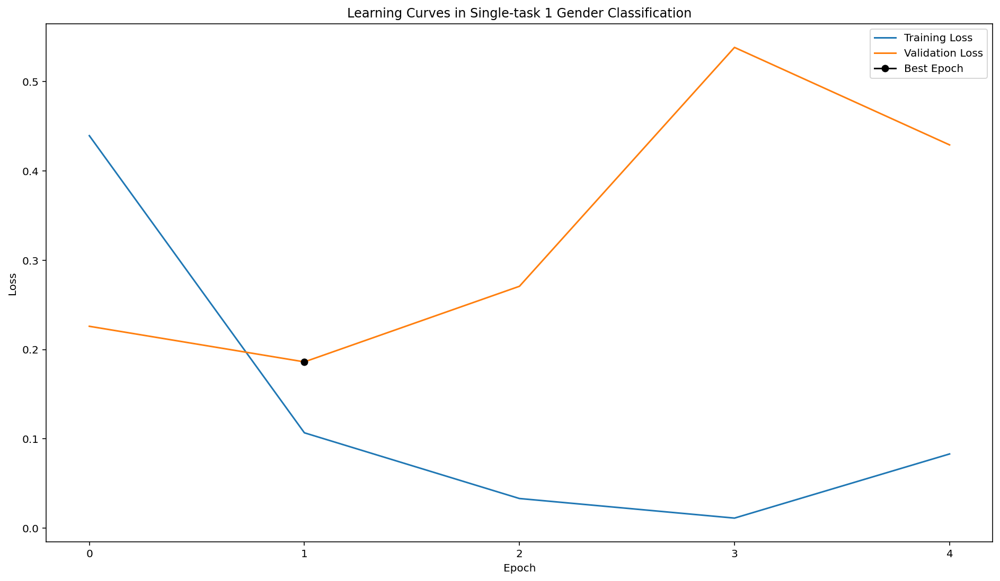

In [16]:
trainer_1 = Trainer(train_set,
                    val_set,
                    batch_size,
                    n_epochs,
                    learning_rate,
                    model_1,
                    loss_1,
                    device,
                    tag='Single-task 1 Gender Classification',
                    task='gender')

for epoch in tqdm(range(n_epochs)):
  trainer_1.train(epoch)
  trainer_1.validation(epoch)
    
trainer_1.plot_losses()

Testing Setting
Single-task 1 Gender Classification

[Full Test]	Accuracy 0.9600	Recall 0.9200	Precision 1.0000	F1_score 0.9583	AUC_ROC 0.9936




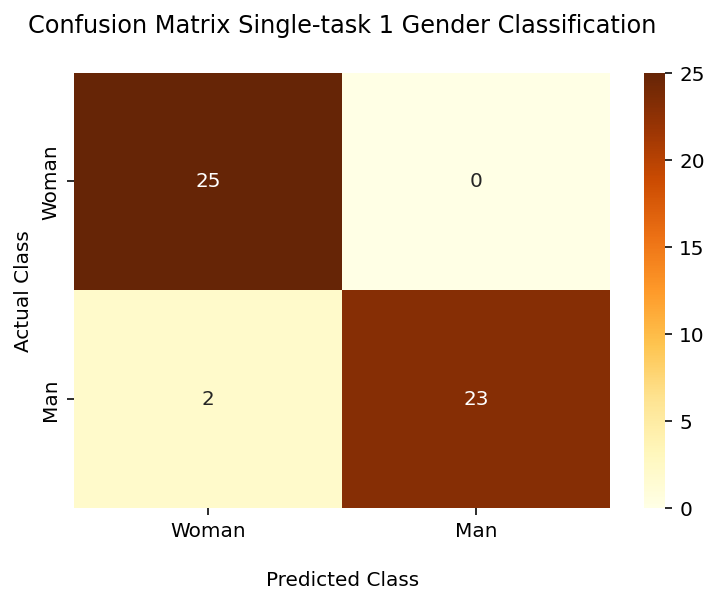

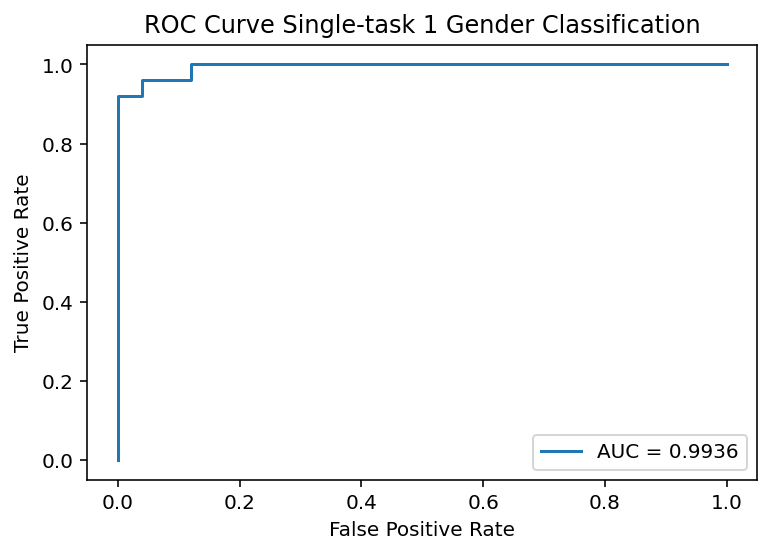

Poorly Classified Examples on top and Well Classified Examples on bottom


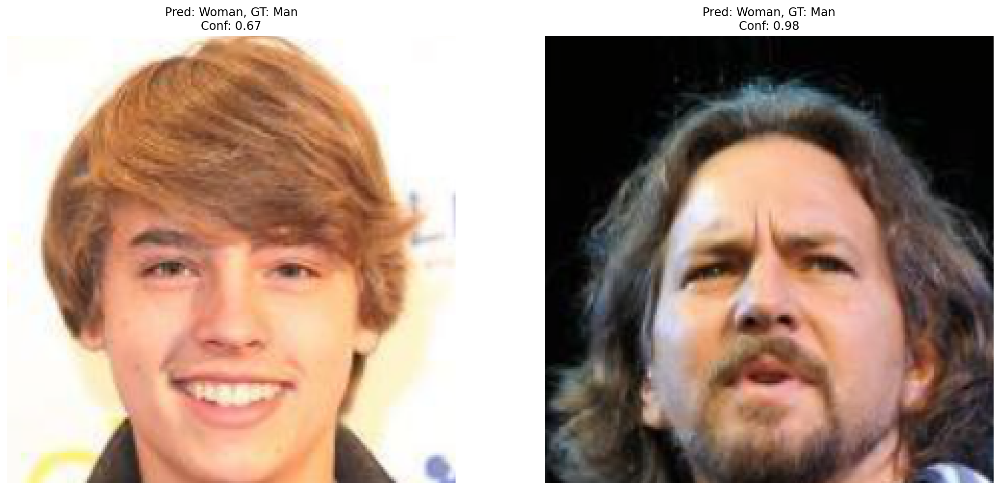

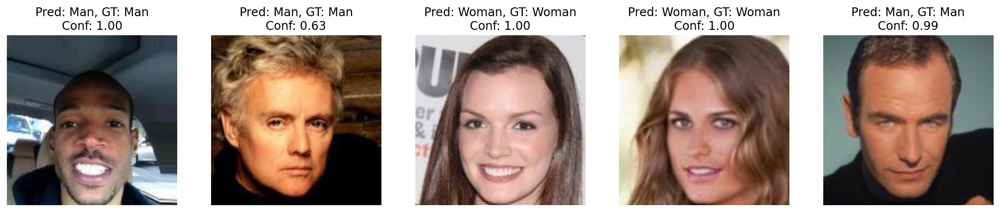

In [17]:
model_1 = BaselineModel(task='gender')
# Load OUR pretrained model
model_1.load_state_dict(torch.load('./gender_best_model.pth'))

tester_1 = Tester(test_set,
                  model_1,
                  device,
                  tag='Single-task 1 Gender Classification',
                  task='gender')

tester_1.test()
tester_1.plot_conf_matrix()
tester_1.plot_roc_curve()
tester_1.plot_examples(invTrans)

Download the best model

In [18]:
FileLink('./gender_best_model.pth')

/kaggle/working/gender_best_model.pth

### Single-task 2 - Face Landmarks Regression <a name="single2"></a>
[(back to top)](#top)


In [19]:
# Create Model 2
model_2 = BaselineModel(task='landmarks')
# Define Loss 1
loss_2 = nn.MSELoss()

Training Setting
Single-task 2 Landmark Regression


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/05]  Train Loss 11.5740 | Val Loss 0.0025 | L_eye_NME 14.797 | R_eye_NME 13.351 | nose_NME 30.229 | L_mouth_NME 42.046 | R_mouth_NME 26.673 | mean_NME 25.419 | std_NME 12.565 | FR(0.1) 0.827
Epoch [02/05]  Train Loss 0.0057 | Val Loss 0.0013 | L_eye_NME 13.132 | R_eye_NME 11.673 | nose_NME 23.894 | L_mouth_NME 24.754 | R_mouth_NME 21.894 | mean_NME 19.069 | std_NME 7.945 | FR(0.1) 0.822
Epoch [03/05]  Train Loss 0.0031 | Val Loss 0.0011 | L_eye_NME 21.427 | R_eye_NME 11.043 | nose_NME 20.115 | L_mouth_NME 15.151 | R_mouth_NME 21.714 | mean_NME 17.890 | std_NME 7.681 | FR(0.1) 0.778
Epoch [04/05]  Train Loss 0.0027 | Val Loss 0.0007 | L_eye_NME 8.503 | R_eye_NME 7.355 | nose_NME 22.200 | L_mouth_NME 13.677 | R_mouth_NME 10.717 | mean_NME 12.490 | std_NME 7.554 | FR(0.1) 0.511
Epoch [05/05]  Train Loss 0.0026 | Val Loss 0.0005 | L_eye_NME 5.256 | R_eye_NME 5.930 | nose_NME 19.667 | L_mouth_NME 8.079 | R_mouth_NME 9.493 | mean_NME 9.685 | std_NME 6.611 | FR(0.1) 0.320


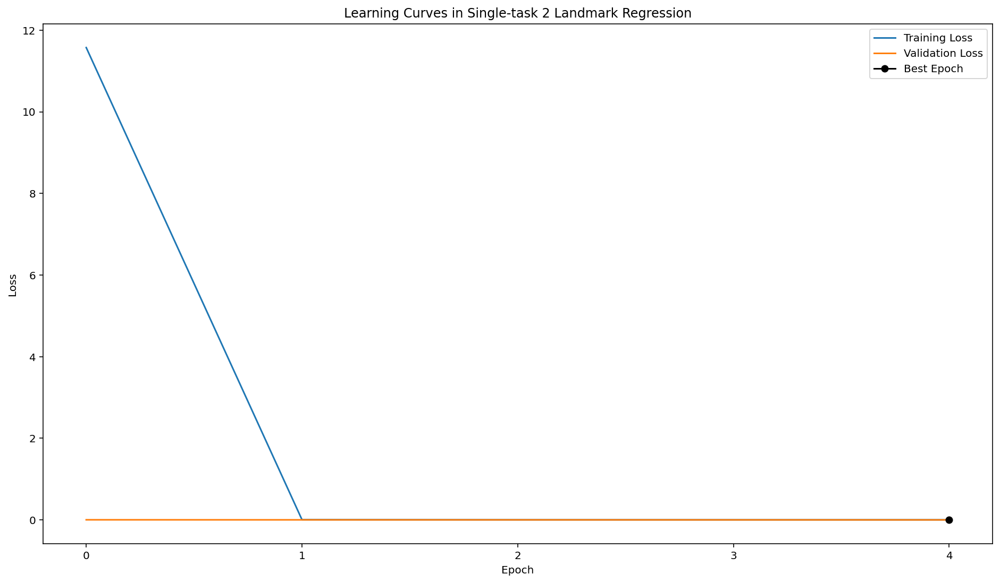

In [20]:
batch_size = 15
n_epochs = 5
learning_rate = 0.001

trainer_2 = Trainer(train_set,
                    val_set,
                    batch_size,
                    n_epochs,
                    learning_rate,
                    model_2,
                    loss_2,
                    device,
                    tag='Single-task 2 Landmark Regression',
                    task='landmarks')

for epoch in tqdm(range(n_epochs)):
  trainer_2.train(epoch)
  trainer_2.validation(epoch)
trainer_2.plot_losses()

Testing Setting
Single-task 2 Landmarks Regression

[Full Test]	L_eye_NME 5.7335	R_eye_NME 4.5846	nose_NME 18.3199	L_mouth_NME 8.0126	R_mouth_NME 8.0182	mean_NME 8.9338	std_NME 6.0223	FR(0.1) 0.2760


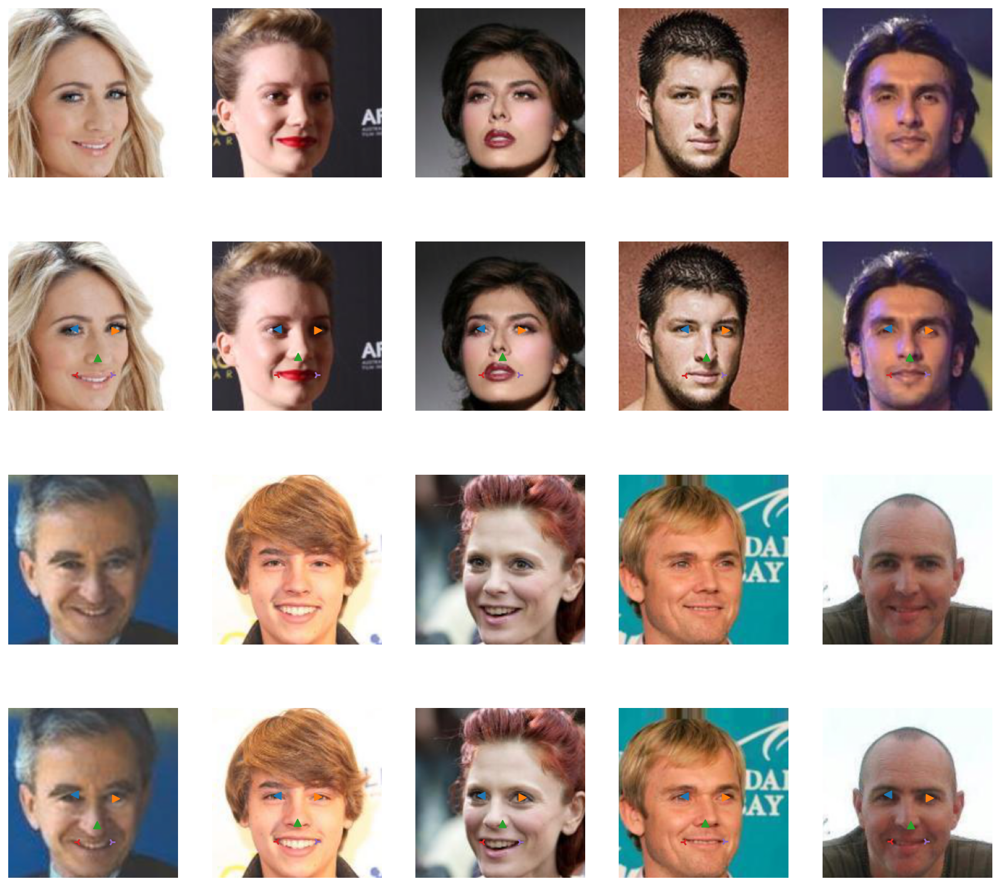

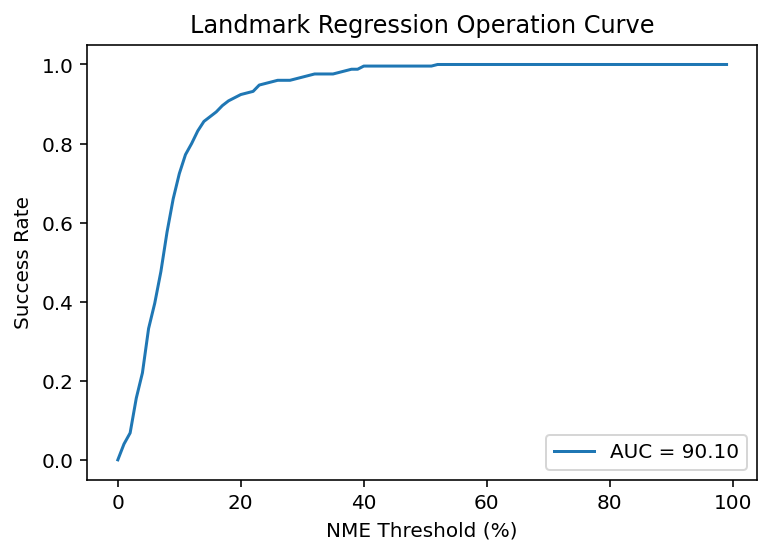

In [21]:
model_2 = BaselineModel(task='landmarks')
# Load OUR pretrained model
model_2.load_state_dict(torch.load('./landmarks_best_model.pth'))

tester_2 = Tester(test_set,
                  model_2,
                  device,
                  tag='Single-task 2 Landmarks Regression',
                  task='landmarks')

tester_2.test()
tester_2.plot_examples(invTrans)
tester_2.plot_reg_curve()

In [22]:
FileLink('./landmarks_best_model.pth')

/kaggle/working/landmarks_best_model.pth

### Multi-Task Setting<a name="multi_task"></a>
[(back to top)](#top)

In [23]:
# Create Model 1
model_3 = BaselineModel(task='multi_task')
# Define Loss 1
loss_3 = [nn.CrossEntropyLoss(), nn.MSELoss()]
# Definer Lambdas to give different weights to each loss
lmbds = [1, 50] 

Training Setting
Multi-Task Setting


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.5206 | Train MSEL 0.0453  | Train Loss 2.7865 |  Val CEL 0.3264 | Val MSEL 0.0065 | Val Loss 0.6514 | Accuracy 0.867 | Recall 0.800 | Precision 0.917 | F1_score 0.824 | AUC_ROC 0.975 | L_eye_NME 37.421 | R_eye_NME 33.197 | nose_NME 49.331 | L_mouth_NME 42.399 | R_mouth_NME 45.216 | mean_NME 41.513 | std_NME 9.708 | FR(0.1) 0.964

Epoch [02/10]  Train CEL 0.2816 | Train MSEL 0.0076  | Train Loss 0.6626 |  Val CEL 0.3300 | Val MSEL 0.0016 | Val Loss 0.4098 | Accuracy 0.867 | Recall 1.000 | Precision 0.774 | F1_score 0.870 | AUC_ROC 0.988 | L_eye_NME 12.156 | R_eye_NME 18.247 | nose_NME 27.305 | L_mouth_NME 20.360 | R_mouth_NME 20.070 | mean_NME 19.628 | std_NME 7.991 | FR(0.1) 0.773

Epoch [03/10]  Train CEL 0.1129 | Train MSEL 0.0055  | Train Loss 0.3903 |  Val CEL 0.0956 | Val MSEL 0.0011 | Val Loss 0.1503 | Accuracy 0.956 | Recall 1.000 | Precision 0.889 | F1_score 0.933 | AUC_ROC 1.000 | L_eye_NME 12.827 | R_eye_NME 10.974 | nose_NME 20.480 | L_mouth_NME 2

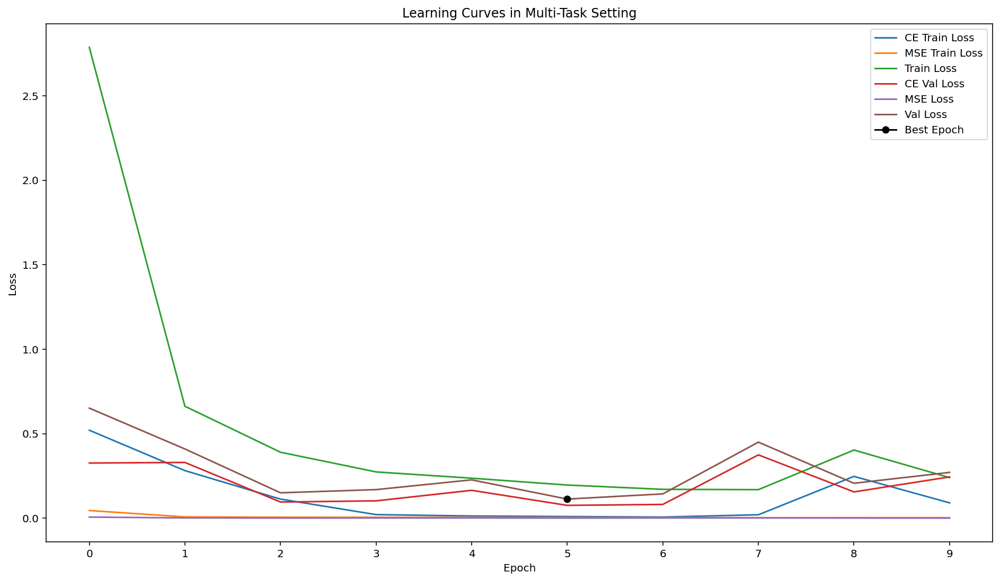

In [24]:
batch_size = 15
n_epochs = 10
learning_rate = 0.0001

trainer_3 = Trainer(train_set,
                    val_set,
                    batch_size,
                    n_epochs,
                    learning_rate,
                    model_3,
                    loss_3,
                    device,
                    lmbds,
                    tag='Multi-Task Setting',
                    task='multi_task')

for epoch in tqdm(range(n_epochs)):
  trainer_3.train(epoch)
  trainer_3.validation(epoch)
trainer_3.plot_losses()

Testing Setting
Multi-task Setting

[Full Test]	Accuracy 0.9400	Recall 0.9600	Precision 0.9231	F1_score 0.9412	AUC_ROC 0.9904	L_eye_NME 8.2827	R_eye_NME 11.1344	nose_NME 13.1125	L_mouth_NME 14.3454	R_mouth_NME 13.5862	mean_NME 12.0923	std_NME 4.9878	FR(0.1) 0.5240




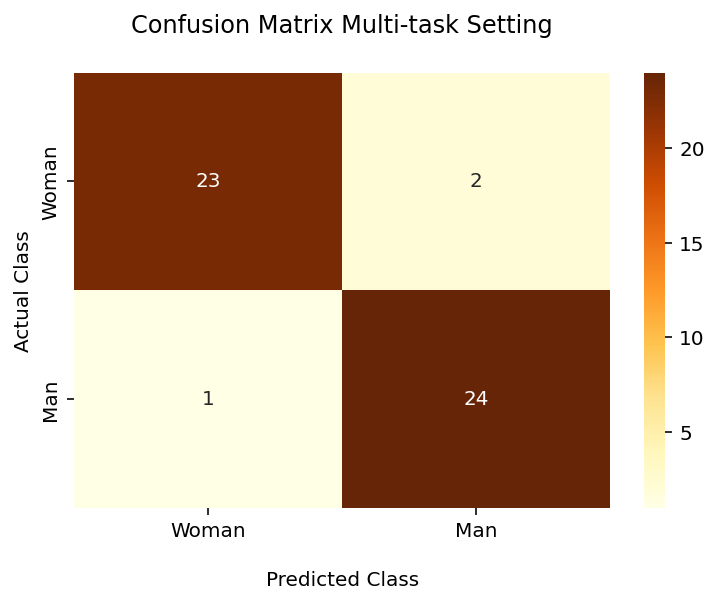

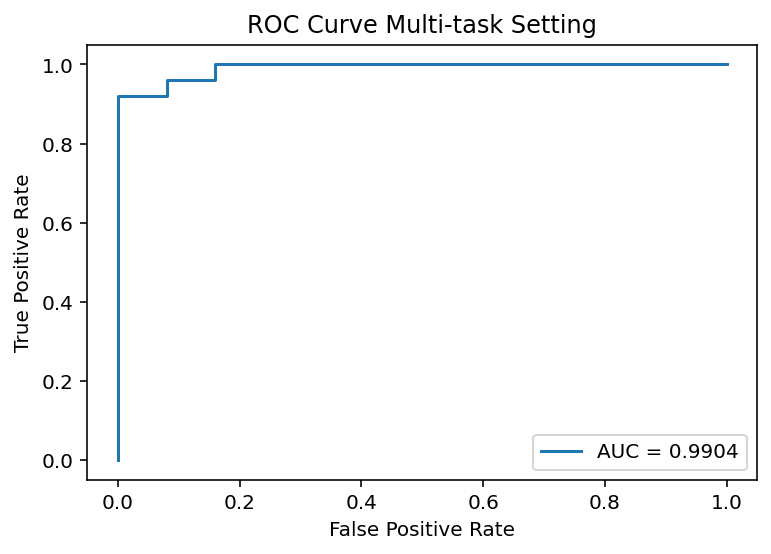

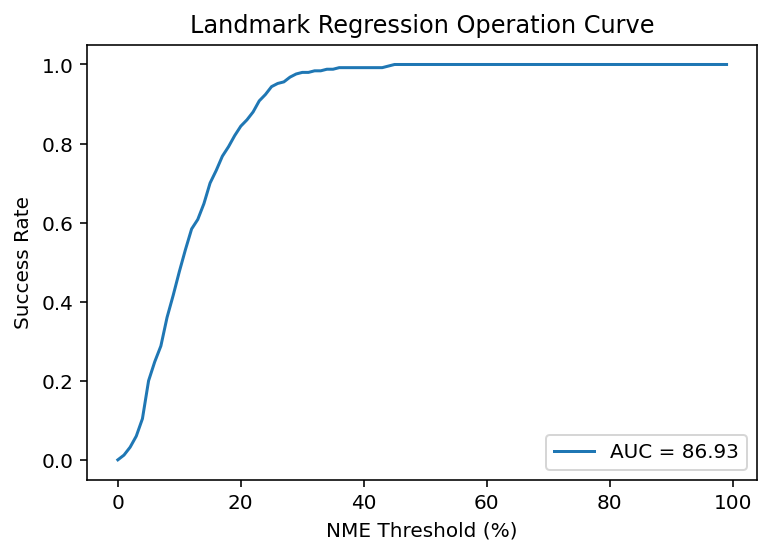

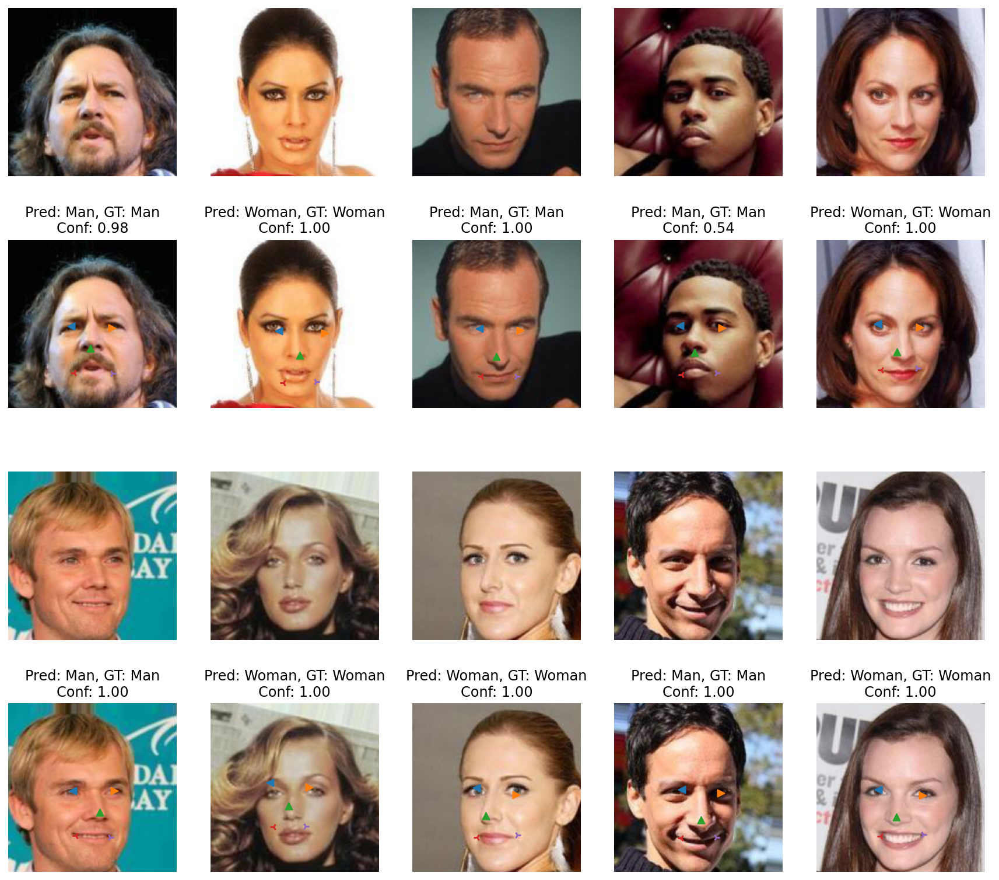

In [25]:
model_3 = BaselineModel(task='multi_task')
# Load OUR pretrained model
model_3.load_state_dict(torch.load('./multi_task_best_model.pth'))

tester_3 = Tester(test_set,
                  model_3,
                  device,
                  tag='Multi-task Setting',
                  task='multi_task')

tester_3.test()
tester_3.plot_conf_matrix()
tester_3.plot_roc_curve()
tester_3.plot_reg_curve()
tester_3.plot_examples(invTrans)

### Improvement Self-Attention <a name="improvements"></a>
[(back to top)](#top)

In [26]:
# Create Model 1
model_4 = MultiAttentionVGG()
# Define Loss 1
loss_4 = [nn.CrossEntropyLoss(), nn.MSELoss()]
# Definer Lambdas to give different weights to each loss
lmbds = [1, 20] 

Training Setting
Improvement no.1 Self Attention Layers


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.6507 | Train MSEL 0.0991  | Train Loss 2.6322 |  Val CEL 0.5880 | Val MSEL 0.0064 | Val Loss 0.7155 | Accuracy 0.511 | Recall 0.000 | Precision 0.000 | F1_score 0.000 | AUC_ROC 0.940 | L_eye_NME 52.710 | R_eye_NME 39.293 | nose_NME 44.550 | L_mouth_NME 40.096 | R_mouth_NME 34.608 | mean_NME 42.251 | std_NME 12.483 | FR(0.1) 0.973

Epoch [02/10]  Train CEL 0.3956 | Train MSEL 0.0145  | Train Loss 0.6849 |  Val CEL 0.3179 | Val MSEL 0.0052 | Val Loss 0.4227 | Accuracy 0.867 | Recall 1.000 | Precision 0.800 | F1_score 0.882 | AUC_ROC 0.946 | L_eye_NME 28.529 | R_eye_NME 30.544 | nose_NME 44.493 | L_mouth_NME 44.101 | R_mouth_NME 41.158 | mean_NME 37.765 | std_NME 9.291 | FR(0.1) 0.938

Epoch [03/10]  Train CEL 0.1549 | Train MSEL 0.0090  | Train Loss 0.3342 |  Val CEL 0.1400 | Val MSEL 0.0077 | Val Loss 0.2943 | Accuracy 0.956 | Recall 0.963 | Precision 0.963 | F1_score 0.963 | AUC_ROC 0.988 | L_eye_NME 42.183 | R_eye_NME 39.790 | nose_NME 46.683 | L_mouth_NME 

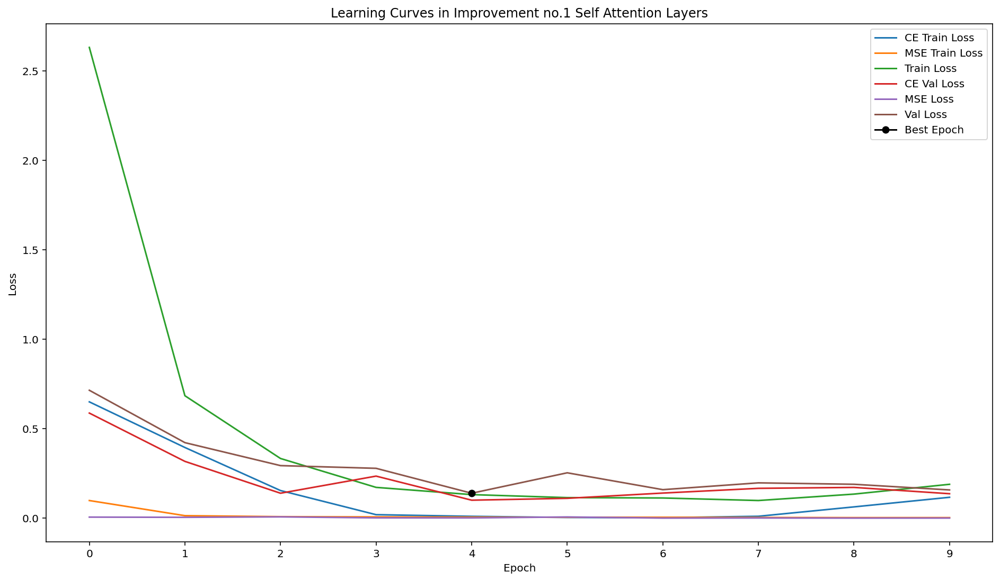

In [27]:
batch_size = 15
n_epochs = 10
learning_rate = 0.0001

trainer_4 = Trainer(train_set,
                    val_set,
                    batch_size,
                    n_epochs,
                    learning_rate,
                    model_4,
                    loss_4,
                    device,
                    lmbds,
                    tag='Improvement no.1 Self Attention Layers',
                    task='multi_task')

for epoch in tqdm(range(n_epochs)):
  trainer_4.train(epoch)
  trainer_4.validation(epoch)
trainer_4.plot_losses()

Testing Setting
Multi-task Setting

[Full Test]	Accuracy 0.9400	Recall 1.0000	Precision 0.8929	F1_score 0.9434	AUC_ROC 0.9952	L_eye_NME 16.1541	R_eye_NME 16.8633	nose_NME 22.6943	L_mouth_NME 20.9725	R_mouth_NME 20.9903	mean_NME 19.5349	std_NME 5.6513	FR(0.1) 0.7680




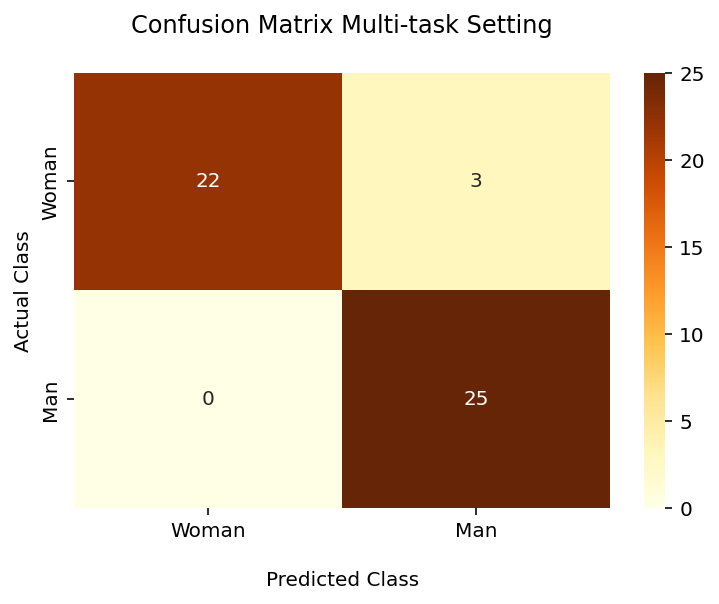

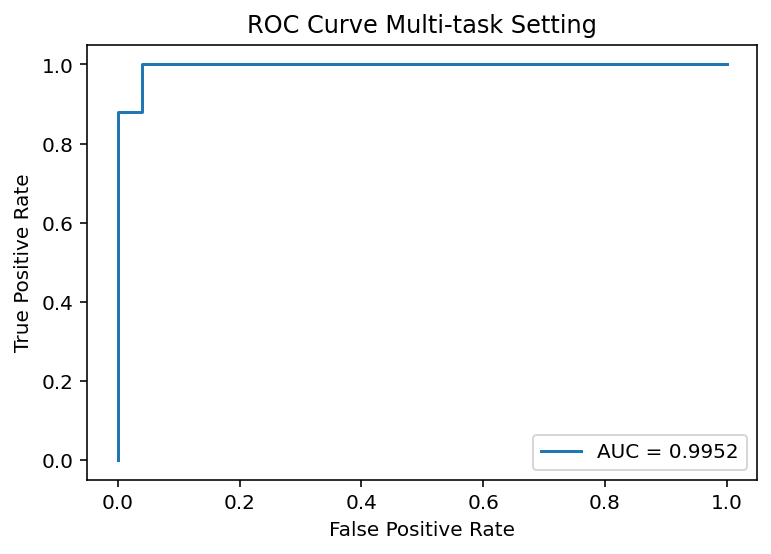

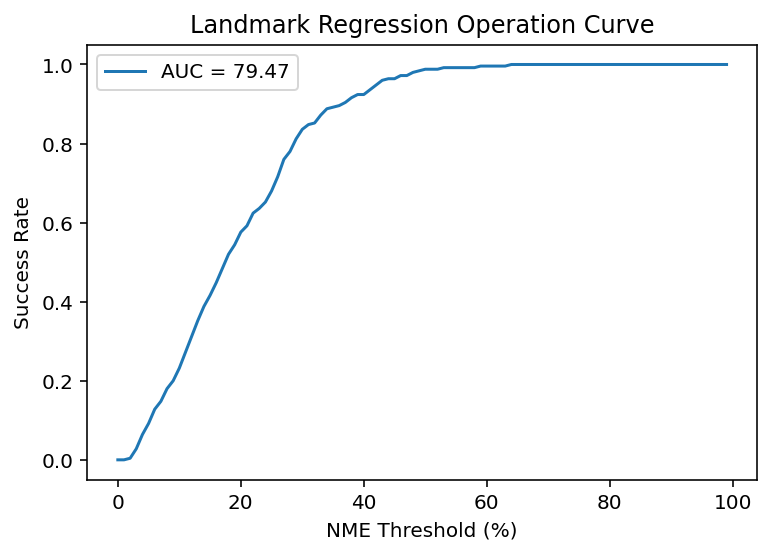

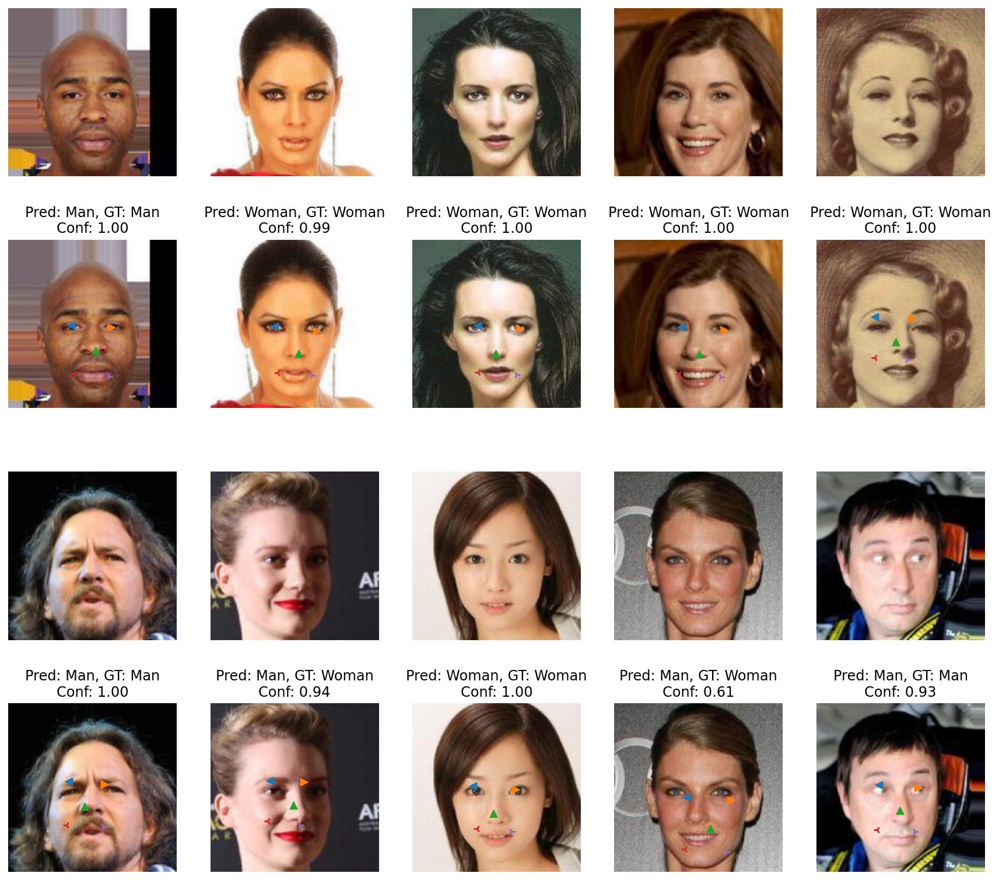

In [28]:
model_4 = MultiAttentionVGG()
# Load OUR pretrained model
model_4.load_state_dict(torch.load('./multi_task_best_model.pth'))

tester_4 = Tester(test_set,
                  model_4,
                  device,
                  tag='Multi-task Setting',
                  task='multi_task')

tester_4.test()
tester_4.plot_conf_matrix()
tester_4.plot_roc_curve()
tester_4.plot_reg_curve()
tester_4.plot_examples(invTrans)


## 🧪 Experiments<a name="experiments"></a>
### Different Optimizers <a name="exp1"></a>
[(back to top)](#top)

Training Setting
Single-task 1 Gender Classification
Experiment #0 Optimizer = Adam


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch [01/10]  Train Loss 0.4077 | Val Loss 0.3091 | Accuracy 0.844 | Recall 1.000 | Precision 0.759 | F1_score 0.862 | AUC_ROC 0.970
Epoch [02/10]  Train Loss 0.0917 | Val Loss 0.2400 | Accuracy 0.956 | Recall 0.958 | Precision 0.958 | F1_score 0.958 | AUC_ROC 0.970
Epoch [03/10]  Train Loss 0.0306 | Val Loss 0.3462 | Accuracy 0.889 | Recall 0.833 | Precision 0.958 | F1_score 0.881 | AUC_ROC 1.000
Epoch [04/10]  Train Loss 0.0337 | Val Loss 0.3391 | Accuracy 0.933 | Recall 0.958 | Precision 0.917 | F1_score 0.936 | AUC_ROC 0.964
Epoch [05/10]  Train Loss 0.0936 | Val Loss 0.3203 | Accuracy 0.978 | Recall 1.000 | Precision 0.958 | F1_score 0.978 | AUC_ROC 0.958
Epoch [06/10]  Train Loss 0.0168 | Val Loss 0.6913 | Accuracy 0.956 | Recall 1.000 | Precision 0.917 | F1_score 0.952 | AUC_ROC 0.969
Epoch [07/10]  Train Loss 0.1323 | Val Loss 0.3284 | Accuracy 0.911 | Recall 0.849 | Precision 0.967 | F1_score 0.897 | AUC_ROC 0.976
Epoch [08/10]  Train Loss 0.0080 | Val Loss 0.2892 | Accuracy 

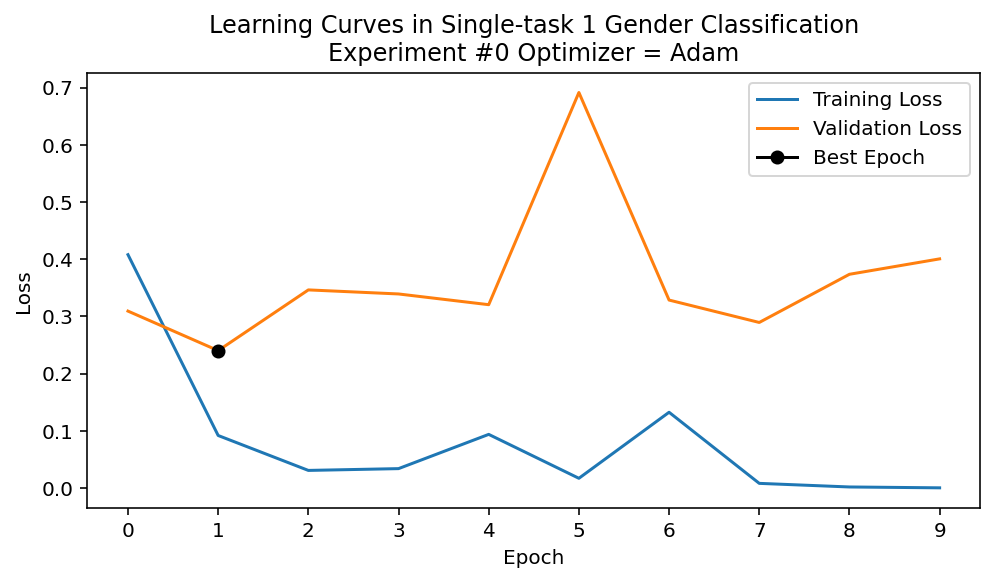

Training Setting
Single-task 1 Gender Classification
Experiment #1 Optimizer = Adamax


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch [01/10]  Train Loss 0.3396 | Val Loss 0.0983 | Accuracy 0.978 | Recall 1.000 | Precision 0.944 | F1_score 0.970 | AUC_ROC 1.000
Epoch [02/10]  Train Loss 0.0706 | Val Loss 0.1331 | Accuracy 0.978 | Recall 1.000 | Precision 0.963 | F1_score 0.980 | AUC_ROC 1.000
Epoch [03/10]  Train Loss 0.0157 | Val Loss 0.0865 | Accuracy 0.978 | Recall 1.000 | Precision 0.963 | F1_score 0.980 | AUC_ROC 1.000
Epoch [04/10]  Train Loss 0.0204 | Val Loss 0.0763 | Accuracy 0.978 | Recall 1.000 | Precision 0.952 | F1_score 0.974 | AUC_ROC 1.000
Epoch [05/10]  Train Loss 0.0020 | Val Loss 0.1500 | Accuracy 0.956 | Recall 1.000 | Precision 0.889 | F1_score 0.938 | AUC_ROC 1.000
Epoch [06/10]  Train Loss 0.0006 | Val Loss 0.1273 | Accuracy 0.978 | Recall 1.000 | Precision 0.963 | F1_score 0.980 | AUC_ROC 1.000
Epoch [07/10]  Train Loss 0.0005 | Val Loss 0.1617 | Accuracy 0.956 | Recall 1.000 | Precision 0.921 | F1_score 0.958 | AUC_ROC 0.994
Epoch [08/10]  Train Loss 0.0007 | Val Loss 0.1672 | Accuracy 

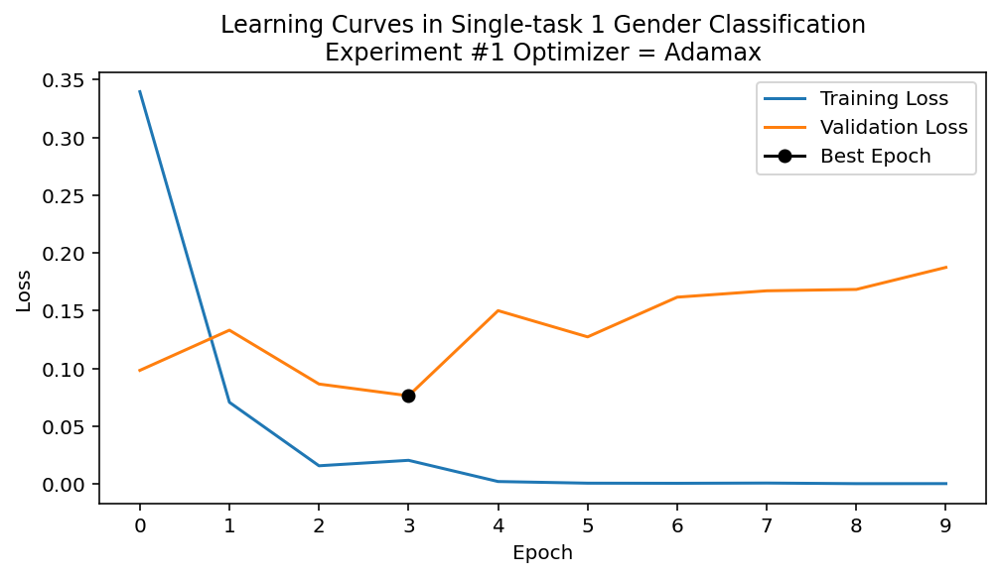

Training Setting
Single-task 1 Gender Classification
Experiment #2 Optimizer = Adagrad


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch [01/10]  Train Loss 0.3884 | Val Loss 0.1500 | Accuracy 0.889 | Recall 0.967 | Precision 0.800 | F1_score 0.856 | AUC_ROC 0.993
Epoch [02/10]  Train Loss 0.1316 | Val Loss 0.1126 | Accuracy 0.933 | Recall 0.958 | Precision 0.933 | F1_score 0.941 | AUC_ROC 1.000
Epoch [03/10]  Train Loss 0.0475 | Val Loss 0.1600 | Accuracy 0.956 | Recall 1.000 | Precision 0.914 | F1_score 0.954 | AUC_ROC 1.000
Epoch [04/10]  Train Loss 0.0193 | Val Loss 0.1372 | Accuracy 0.933 | Recall 0.963 | Precision 0.933 | F1_score 0.943 | AUC_ROC 1.000
Epoch [05/10]  Train Loss 0.0086 | Val Loss 0.1386 | Accuracy 0.933 | Recall 0.963 | Precision 0.917 | F1_score 0.933 | AUC_ROC 1.000
Epoch [06/10]  Train Loss 0.0073 | Val Loss 0.1563 | Accuracy 0.933 | Recall 0.958 | Precision 0.925 | F1_score 0.941 | AUC_ROC 0.994
Epoch [07/10]  Train Loss 0.0039 | Val Loss 0.1913 | Accuracy 0.933 | Recall 0.944 | Precision 0.926 | F1_score 0.928 | AUC_ROC 1.000
Epoch [08/10]  Train Loss 0.0039 | Val Loss 0.1798 | Accuracy 

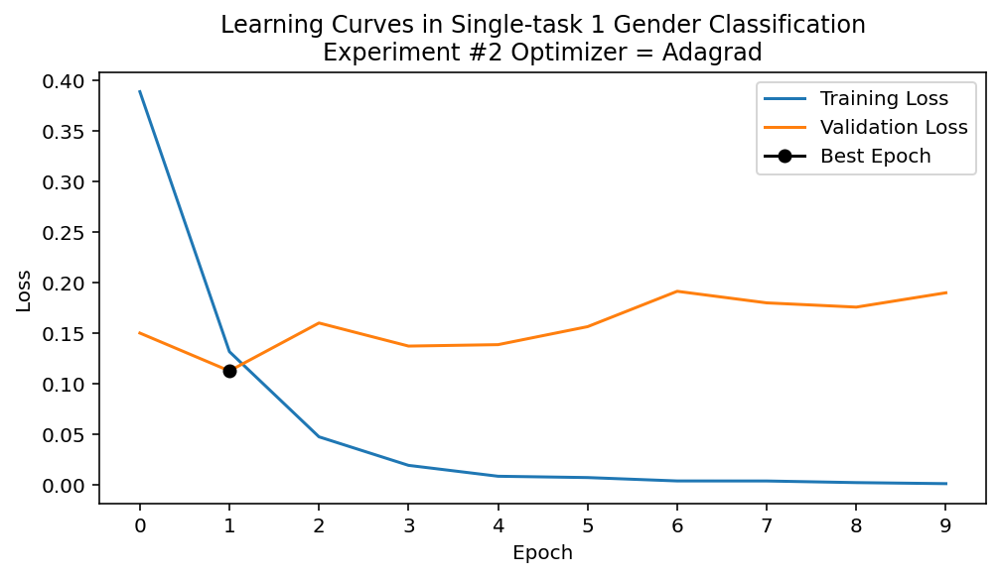

Training Setting
Single-task 1 Gender Classification
Experiment #3 Optimizer = RMSProp


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch [01/10]  Train Loss 1.7172 | Val Loss 0.7072 | Accuracy 0.489 | Recall 1.000 | Precision 0.489 | F1_score 0.654 | AUC_ROC 0.821
Epoch [02/10]  Train Loss 0.7364 | Val Loss 0.6924 | Accuracy 0.489 | Recall 1.000 | Precision 0.489 | F1_score 0.654 | AUC_ROC 0.830
Epoch [03/10]  Train Loss 0.6814 | Val Loss 0.8036 | Accuracy 0.556 | Recall 0.167 | Precision 0.667 | F1_score 0.262 | AUC_ROC 0.722
Epoch [04/10]  Train Loss 0.7565 | Val Loss 0.6559 | Accuracy 0.733 | Recall 0.506 | Precision 0.917 | F1_score 0.644 | AUC_ROC 0.738
Epoch [05/10]  Train Loss 0.5429 | Val Loss 0.4546 | Accuracy 0.800 | Recall 1.000 | Precision 0.709 | F1_score 0.827 | AUC_ROC 0.884
Epoch [06/10]  Train Loss 0.3855 | Val Loss 0.4391 | Accuracy 0.844 | Recall 1.000 | Precision 0.720 | F1_score 0.825 | AUC_ROC 0.925
Epoch [07/10]  Train Loss 0.2021 | Val Loss 0.2623 | Accuracy 0.889 | Recall 0.812 | Precision 0.944 | F1_score 0.869 | AUC_ROC 0.969
Epoch [08/10]  Train Loss 0.3155 | Val Loss 0.3248 | Accuracy 

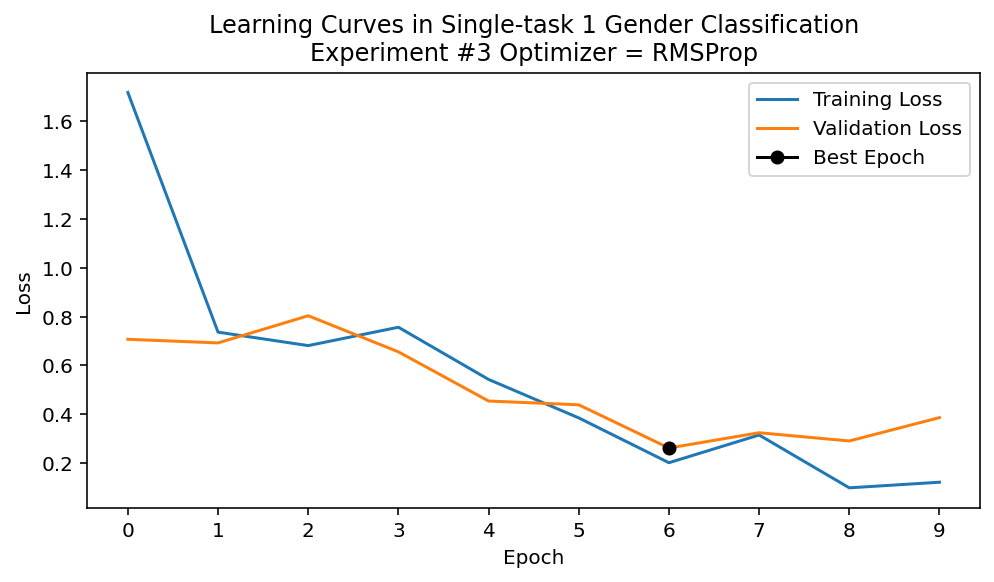

In [50]:
batch_size = 15
n_epochs = 10
learning_rate = 0.0001
# Get device, CUDA or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

optimizers = ['Adam', 'Adamax', 'Adagrad', 'RMSProp']

for c, o in enumerate(optimizers):
    
    # Create Model 1
    model_1 = BaselineModel(task='gender').to(device)
    
    # Define Loss 1
    loss_1 = nn.CrossEntropyLoss()

    trainer_1 = Trainer(train_set,
                        val_set,
                        batch_size,
                        n_epochs,
                        learning_rate,
                        model_1,
                        loss_1,
                        device,
                        opti=o,
                        out_path=f"1_exp{c}",
                        tag=f"Single-task 1 Gender Classification\nExperiment #{c} Optimizer = {o}",
                        task='gender')

    for epoch in tqdm(range(n_epochs)):
      trainer_1.train(epoch)
      trainer_1.validation(epoch)

    trainer_1.plot_losses()



| Optimizer  | Val. Loss | Accuracy | Recall | Precision | F1-Score | AUC ROC |
|:----------:|:---------:|:--------:|:------:|:---------:|:--------:|:-------:|
|    Adam    |   0.2400  |   0.956  |  0.958 |   0.958   |   0.958  |  0.970  |
|   Adamax   |   0.0763  |   0.978  |  1.000 |   0.952   |   0.974  |  1.000  |
|   Adagrad  |   0.1126  |   0.933  |  0.958 |   0.933   |   0.941  |  1.000  |
|   RMSprop  |   0.2623  |   0.889  |  0.812 |   0.944   |   0.869  |  0.969  |

Looking at the final results, Adamax seems to be the best optimizer. We will used it onwards. Let's download for delivery and test it.

In [51]:
FileLink('./1_exp1.pth')

/kaggle/working/1_exp1.pth

### Different Losses <a name="exp2"></a>
[(back to top)](#top)

Training Setting
Single-task 2 Landmark Regression
Experiment #0 Loss = L1


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch [01/10]  Train Loss 0.1683 | Val Loss 0.0514 | L_eye_NME 28.679 | R_eye_NME 35.282 | nose_NME 36.236 | L_mouth_NME 32.803 | R_mouth_NME 33.173 | mean_NME 33.235 | std_NME 11.163 | FR(0.1) 0.942
Epoch [02/10]  Train Loss 0.0888 | Val Loss 0.0586 | L_eye_NME 37.357 | R_eye_NME 35.964 | nose_NME 33.642 | L_mouth_NME 39.352 | R_mouth_NME 41.223 | mean_NME 37.508 | std_NME 8.045 | FR(0.1) 0.982
Epoch [03/10]  Train Loss 0.0741 | Val Loss 0.0402 | L_eye_NME 22.190 | R_eye_NME 21.939 | nose_NME 29.284 | L_mouth_NME 25.363 | R_mouth_NME 25.889 | mean_NME 24.933 | std_NME 7.325 | FR(0.1) 0.862
Epoch [04/10]  Train Loss 0.0653 | Val Loss 0.0283 | L_eye_NME 11.941 | R_eye_NME 16.188 | nose_NME 19.454 | L_mouth_NME 20.066 | R_mouth_NME 21.237 | mean_NME 17.777 | std_NME 6.944 | FR(0.1) 0.791
Epoch [05/10]  Train Loss 0.0587 | Val Loss 0.0242 | L_eye_NME 12.320 | R_eye_NME 14.458 | nose_NME 20.212 | L_mouth_NME 12.686 | R_mouth_NME 19.938 | mean_NME 15.923 | std_NME 6.334 | FR(0.1) 0.702
Epoc

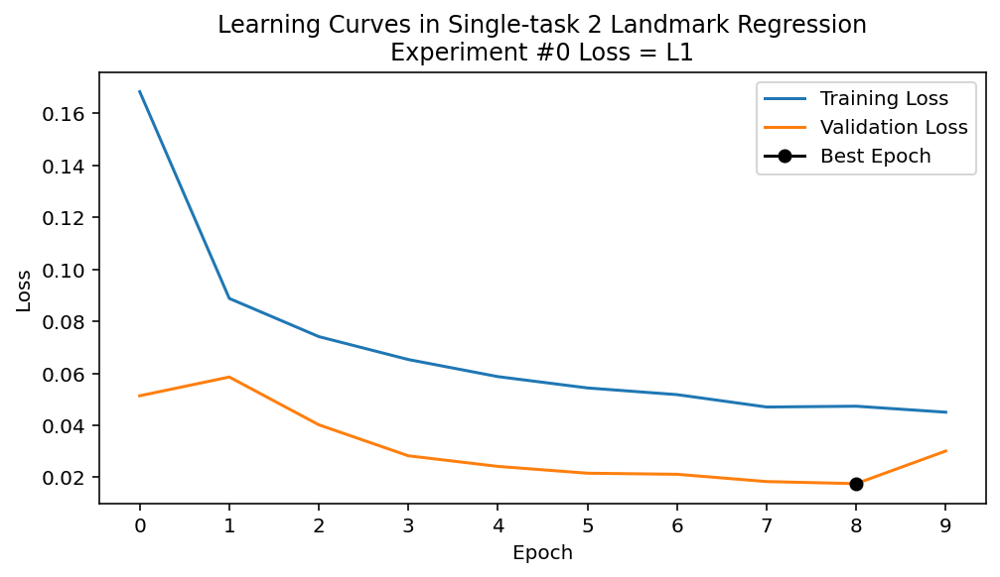

Training Setting
Single-task 2 Landmark Regression
Experiment #1 Loss = L2


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch [01/10]  Train Loss 0.0519 | Val Loss 0.0060 | L_eye_NME 37.957 | R_eye_NME 33.992 | nose_NME 43.606 | L_mouth_NME 40.027 | R_mouth_NME 43.655 | mean_NME 39.847 | std_NME 12.213 | FR(0.1) 0.956
Epoch [02/10]  Train Loss 0.0126 | Val Loss 0.0025 | L_eye_NME 20.699 | R_eye_NME 23.192 | nose_NME 29.364 | L_mouth_NME 27.182 | R_mouth_NME 26.941 | mean_NME 25.476 | std_NME 9.233 | FR(0.1) 0.876
Epoch [03/10]  Train Loss 0.0091 | Val Loss 0.0022 | L_eye_NME 18.606 | R_eye_NME 23.025 | nose_NME 28.337 | L_mouth_NME 20.692 | R_mouth_NME 27.205 | mean_NME 23.573 | std_NME 8.940 | FR(0.1) 0.840
Epoch [04/10]  Train Loss 0.0077 | Val Loss 0.0018 | L_eye_NME 16.962 | R_eye_NME 19.829 | nose_NME 26.196 | L_mouth_NME 19.588 | R_mouth_NME 24.553 | mean_NME 21.426 | std_NME 7.454 | FR(0.1) 0.813
Epoch [05/10]  Train Loss 0.0072 | Val Loss 0.0019 | L_eye_NME 20.338 | R_eye_NME 21.007 | nose_NME 24.257 | L_mouth_NME 20.365 | R_mouth_NME 25.245 | mean_NME 22.242 | std_NME 6.779 | FR(0.1) 0.840
Epoc

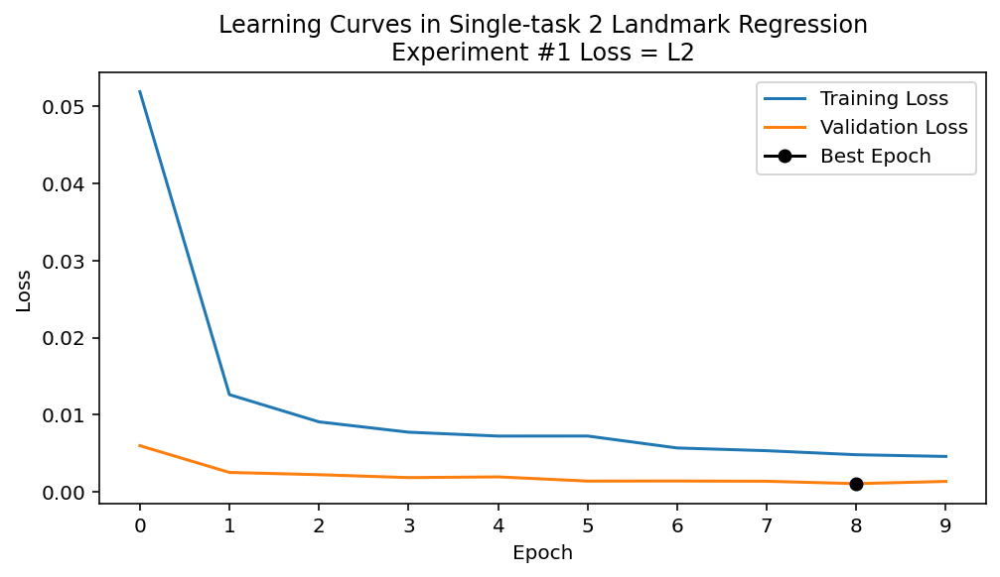

Training Setting
Single-task 2 Landmark Regression
Experiment #2 Loss = L1 smooth


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch [01/10]  Train Loss 0.0239 | Val Loss 0.0016 | L_eye_NME 27.210 | R_eye_NME 26.181 | nose_NME 29.762 | L_mouth_NME 29.704 | R_mouth_NME 31.337 | mean_NME 28.839 | std_NME 10.008 | FR(0.1) 0.916
Epoch [02/10]  Train Loss 0.0059 | Val Loss 0.0012 | L_eye_NME 16.284 | R_eye_NME 25.311 | nose_NME 28.231 | L_mouth_NME 26.438 | R_mouth_NME 25.331 | mean_NME 24.319 | std_NME 7.999 | FR(0.1) 0.831
Epoch [03/10]  Train Loss 0.0045 | Val Loss 0.0014 | L_eye_NME 18.354 | R_eye_NME 24.786 | nose_NME 32.817 | L_mouth_NME 29.258 | R_mouth_NME 29.267 | mean_NME 26.896 | std_NME 8.073 | FR(0.1) 0.880
Epoch [04/10]  Train Loss 0.0040 | Val Loss 0.0007 | L_eye_NME 12.902 | R_eye_NME 20.008 | nose_NME 21.469 | L_mouth_NME 19.569 | R_mouth_NME 21.213 | mean_NME 19.032 | std_NME 6.692 | FR(0.1) 0.733
Epoch [05/10]  Train Loss 0.0032 | Val Loss 0.0010 | L_eye_NME 16.739 | R_eye_NME 22.779 | nose_NME 27.735 | L_mouth_NME 21.286 | R_mouth_NME 24.582 | mean_NME 22.624 | std_NME 6.830 | FR(0.1) 0.831
Epoc

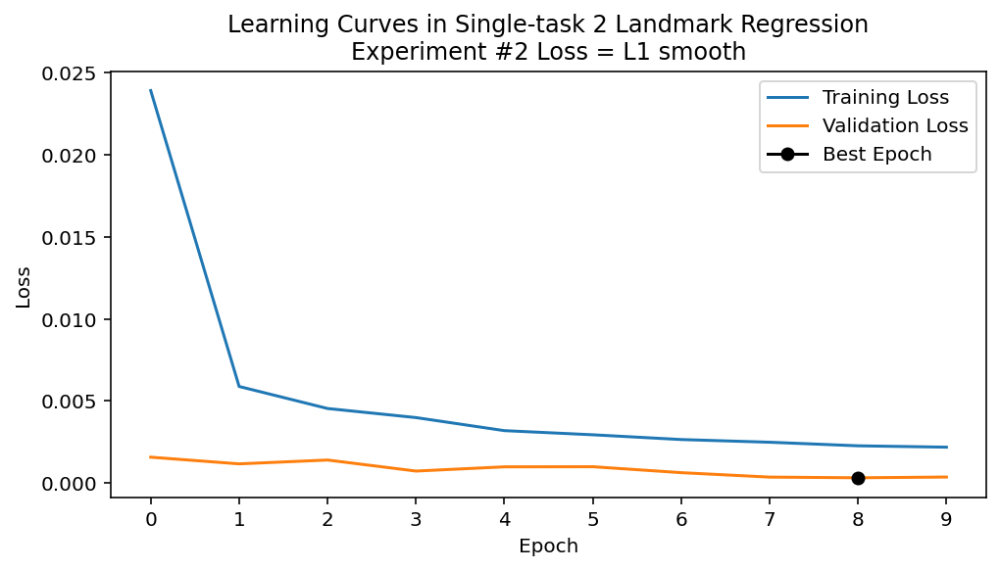

Training Setting
Single-task 2 Landmark Regression
Experiment #3 Loss = Huber


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch [01/10]  Train Loss 0.0241 | Val Loss 0.0022 | L_eye_NME 23.637 | R_eye_NME 40.496 | nose_NME 34.119 | L_mouth_NME 33.214 | R_mouth_NME 39.183 | mean_NME 34.130 | std_NME 12.706 | FR(0.1) 0.938
Epoch [02/10]  Train Loss 0.0058 | Val Loss 0.0012 | L_eye_NME 17.803 | R_eye_NME 22.549 | nose_NME 28.774 | L_mouth_NME 26.060 | R_mouth_NME 25.707 | mean_NME 24.178 | std_NME 8.923 | FR(0.1) 0.822
Epoch [03/10]  Train Loss 0.0044 | Val Loss 0.0009 | L_eye_NME 16.399 | R_eye_NME 17.474 | nose_NME 25.822 | L_mouth_NME 21.627 | R_mouth_NME 23.269 | mean_NME 20.918 | std_NME 8.408 | FR(0.1) 0.804
Epoch [04/10]  Train Loss 0.0038 | Val Loss 0.0011 | L_eye_NME 17.505 | R_eye_NME 21.514 | nose_NME 30.587 | L_mouth_NME 20.108 | R_mouth_NME 27.170 | mean_NME 23.377 | std_NME 8.025 | FR(0.1) 0.871
Epoch [05/10]  Train Loss 0.0034 | Val Loss 0.0007 | L_eye_NME 12.736 | R_eye_NME 15.766 | nose_NME 25.255 | L_mouth_NME 18.160 | R_mouth_NME 20.596 | mean_NME 18.503 | std_NME 6.959 | FR(0.1) 0.738
Epoc

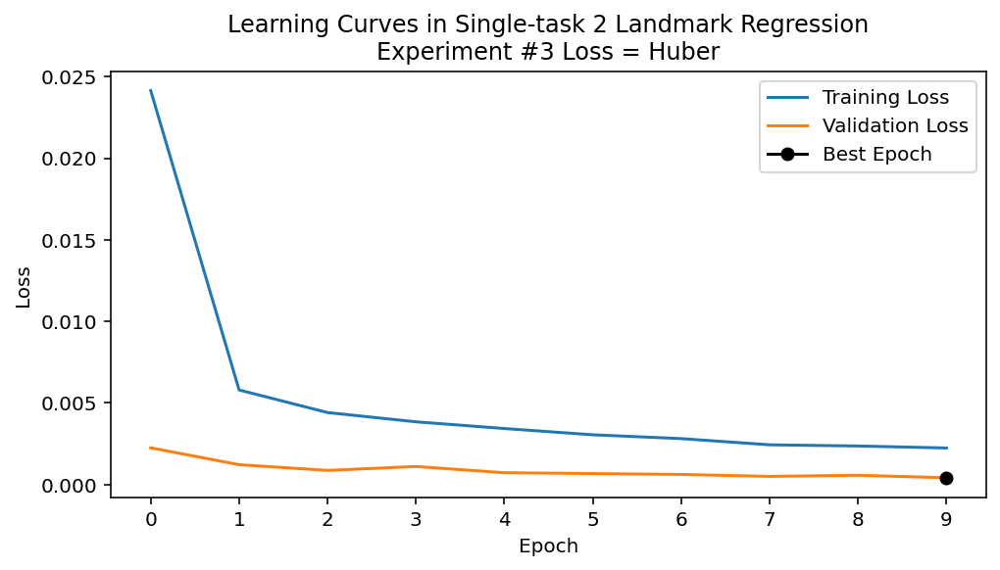

Training Setting
Single-task 2 Landmark Regression
Experiment #4 Loss = Wing


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch [01/10]  Train Loss 1.5687 | Val Loss 0.6601 | L_eye_NME 32.412 | R_eye_NME 45.374 | nose_NME 50.106 | L_mouth_NME 58.446 | R_mouth_NME 39.873 | mean_NME 45.242 | std_NME 15.156 | FR(0.1) 0.938
Epoch [02/10]  Train Loss 0.8763 | Val Loss 0.3829 | L_eye_NME 19.856 | R_eye_NME 28.126 | nose_NME 32.753 | L_mouth_NME 25.450 | R_mouth_NME 25.583 | mean_NME 26.354 | std_NME 9.840 | FR(0.1) 0.867
Epoch [03/10]  Train Loss 0.7137 | Val Loss 0.2988 | L_eye_NME 15.758 | R_eye_NME 19.998 | nose_NME 23.590 | L_mouth_NME 19.544 | R_mouth_NME 22.993 | mean_NME 20.376 | std_NME 6.626 | FR(0.1) 0.791
Epoch [04/10]  Train Loss 0.6415 | Val Loss 0.2858 | L_eye_NME 15.462 | R_eye_NME 16.096 | nose_NME 23.189 | L_mouth_NME 20.646 | R_mouth_NME 21.208 | mean_NME 19.320 | std_NME 6.763 | FR(0.1) 0.738
Epoch [05/10]  Train Loss 0.6150 | Val Loss 0.2685 | L_eye_NME 15.896 | R_eye_NME 20.560 | nose_NME 22.729 | L_mouth_NME 16.163 | R_mouth_NME 16.799 | mean_NME 18.429 | std_NME 6.149 | FR(0.1) 0.764
Epoc

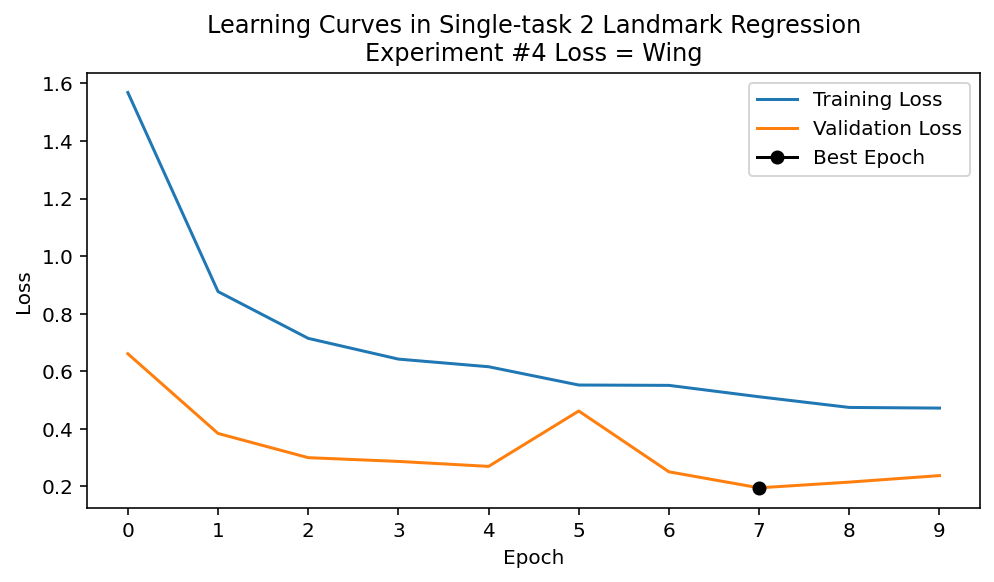

In [59]:
batch_size = 15
n_epochs = 10
learning_rate = 0.0001
# Get device, CUDA or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

losses = [nn.L1Loss(), nn.MSELoss(), nn.SmoothL1Loss(), nn.HuberLoss(), WingLoss()]
losses_names = ['L1', 'L2', 'L1 smooth', 'Huber', 'Wing']

for c, (loss, name) in enumerate(zip(losses, losses_names)):
    
    # Create Model 1
    model_2 = BaselineModel(task='landmarks').to(device)
    
    trainer_2 = Trainer(train_set,
                        val_set,
                        batch_size,
                        n_epochs,
                        learning_rate,
                        model_2,
                        loss,
                        device,
                        opti='Adamax',
                        out_path=f"2_exp{c}",
                        tag=f"Single-task 2 Landmark Regression\nExperiment #{c} Loss = {name}",
                        task='landmarks')

    for epoch in tqdm(range(n_epochs)):
      trainer_2.train(epoch)
      trainer_2.validation(epoch)

    trainer_2.plot_losses()

|    Loss   | Val. Loss |     NME (%)    |   FR 0.1 (%)   |
|:---------:|:---------:|:--------------:|:--------------:|
|     L1    |   0.0176  | 11.230 ± 5.669 |      0.449     |
|     L2    |   0.0011  | 15.717 ± 5.652 |      0.640     |
| L1 Smooth |   0.0003  | 12.452 ± 5.730 |      0.529     |
|   Huber   |   0.0004  | 14.044 ± 5.623 |      0.578     |
|    Wing   |   0.1939  | 16.469 ± 5.286 |      0.587     |

Looking at the final results, L1 seems to be the best loss. We will used it onwards. Let's download for delivery and test it.

In [60]:
FileLink('./2_exp0.pth')

/kaggle/working/2_exp0.pth

### Different Losses' Weights <a name="exp3"></a>
[(back to top)](#top)

Training Setting
Multi-Task Setting
Experiment #0 Lambdas = [1, 1]


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.3416 | Train L1 0.2141  | Train Loss 0.5556 |  Val CEL 0.1543 | Val L1 0.1277 | Val Loss 0.2820 | Accuracy 0.933 | Recall 0.933 | Precision 0.930 | F1_score 0.926 | AUC_ROC 0.994 | L_eye_NME 66.922 | R_eye_NME 74.910 | nose_NME 77.022 | L_mouth_NME 89.291 | R_mouth_NME 85.821 | mean_NME 78.793 | std_NME 21.539 | FR(0.1) 0.996

Epoch [02/10]  Train CEL 0.1294 | Train L1 0.1358  | Train Loss 0.2652 |  Val CEL 0.1202 | Val L1 0.0906 | Val Loss 0.2108 | Accuracy 0.933 | Recall 0.963 | Precision 0.917 | F1_score 0.933 | AUC_ROC 1.000 | L_eye_NME 49.311 | R_eye_NME 53.680 | nose_NME 50.472 | L_mouth_NME 71.801 | R_mouth_NME 58.365 | mean_NME 56.726 | std_NME 17.344 | FR(0.1) 0.978

Epoch [03/10]  Train CEL 0.0567 | Train L1 0.1143  | Train Loss 0.1710 |  Val CEL 0.1699 | Val L1 0.0831 | Val Loss 0.2530 | Accuracy 0.956 | Recall 1.000 | Precision 0.905 | F1_score 0.949 | AUC_ROC 0.994 | L_eye_NME 42.820 | R_eye_NME 52.816 | nose_NME 43.258 | L_mouth_NME 62.172 | R_

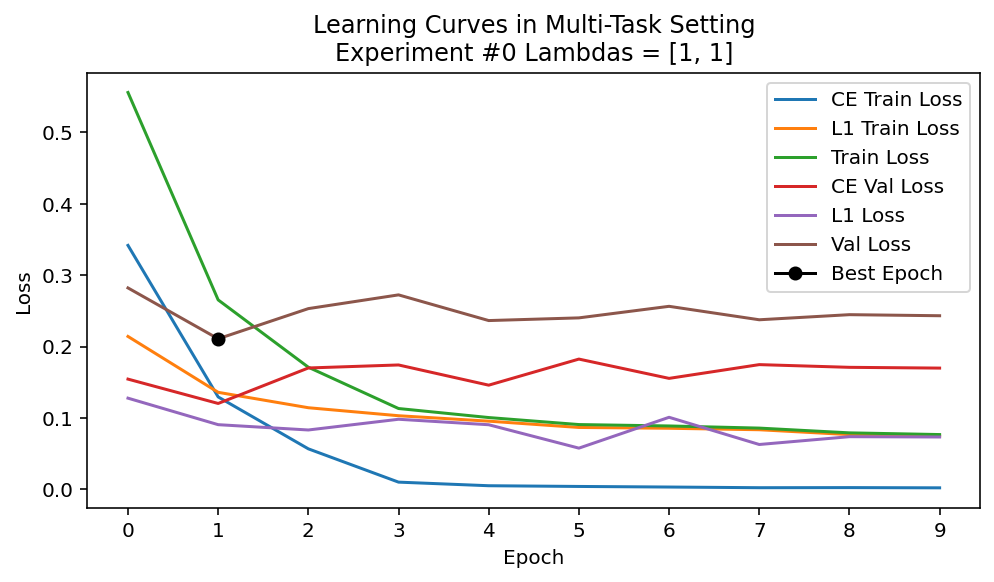

Training Setting
Multi-Task Setting
Experiment #1 Lambdas = [1, 5]


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.5083 | Train L1 0.1782  | Train Loss 1.3992 |  Val CEL 0.2749 | Val L1 0.0695 | Val Loss 0.6222 | Accuracy 0.911 | Recall 1.000 | Precision 0.850 | F1_score 0.919 | AUC_ROC 0.969 | L_eye_NME 36.296 | R_eye_NME 45.558 | nose_NME 49.960 | L_mouth_NME 42.703 | R_mouth_NME 43.999 | mean_NME 43.703 | std_NME 15.231 | FR(0.1) 0.956

Epoch [02/10]  Train CEL 0.2500 | Train L1 0.1041  | Train Loss 0.7708 |  Val CEL 0.2459 | Val L1 0.0419 | Val Loss 0.4552 | Accuracy 0.889 | Recall 1.000 | Precision 0.796 | F1_score 0.883 | AUC_ROC 0.994 | L_eye_NME 20.397 | R_eye_NME 24.620 | nose_NME 32.397 | L_mouth_NME 29.652 | R_mouth_NME 27.459 | mean_NME 26.905 | std_NME 10.485 | FR(0.1) 0.867

Epoch [03/10]  Train CEL 0.1209 | Train L1 0.0879  | Train Loss 0.5604 |  Val CEL 0.0973 | Val L1 0.0457 | Val Loss 0.3260 | Accuracy 0.978 | Recall 1.000 | Precision 0.967 | F1_score 0.982 | AUC_ROC 1.000 | L_eye_NME 24.912 | R_eye_NME 28.776 | nose_NME 34.576 | L_mouth_NME 28.832 | R_

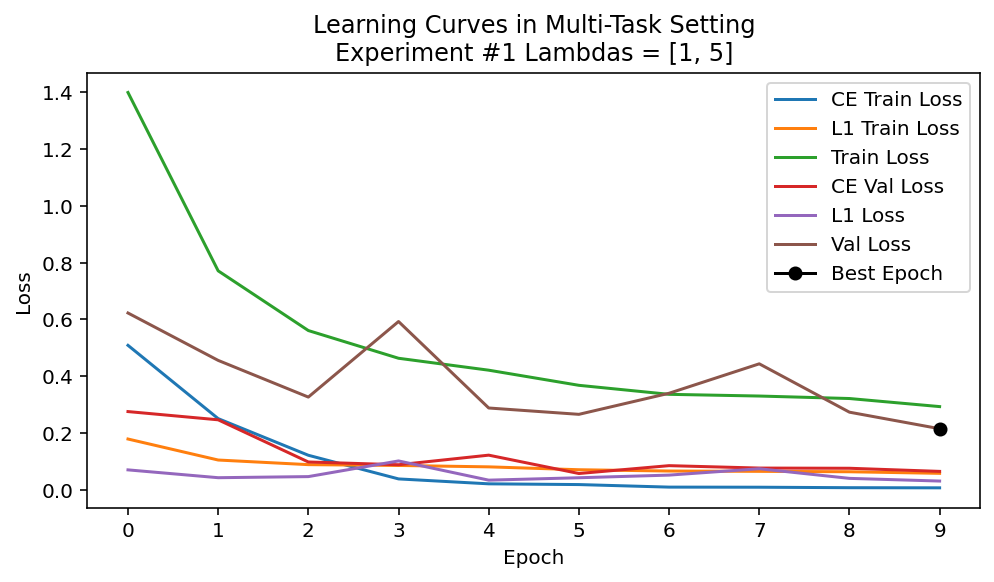

Training Setting
Multi-Task Setting
Experiment #2 Lambdas = [5, 1]


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.3411 | Train L1 0.3008  | Train Loss 2.0064 |  Val CEL 0.1705 | Val L1 0.1436 | Val Loss 0.9959 | Accuracy 0.956 | Recall 1.000 | Precision 0.915 | F1_score 0.955 | AUC_ROC 0.970 | L_eye_NME 73.840 | R_eye_NME 77.028 | nose_NME 91.357 | L_mouth_NME 88.974 | R_mouth_NME 120.215 | mean_NME 90.283 | std_NME 30.798 | FR(0.1) 0.996

Epoch [02/10]  Train CEL 0.0681 | Train L1 0.1702  | Train Loss 0.5108 |  Val CEL 0.2142 | Val L1 0.0934 | Val Loss 1.1642 | Accuracy 0.956 | Recall 1.000 | Precision 0.922 | F1_score 0.958 | AUC_ROC 0.975 | L_eye_NME 40.709 | R_eye_NME 61.276 | nose_NME 56.367 | L_mouth_NME 80.571 | R_mouth_NME 62.893 | mean_NME 60.363 | std_NME 22.565 | FR(0.1) 0.969

Epoch [03/10]  Train CEL 0.0115 | Train L1 0.1532  | Train Loss 0.2107 |  Val CEL 0.1672 | Val L1 0.1144 | Val Loss 0.9504 | Accuracy 0.956 | Recall 1.000 | Precision 0.939 | F1_score 0.967 | AUC_ROC 0.969 | L_eye_NME 48.118 | R_eye_NME 73.817 | nose_NME 72.588 | L_mouth_NME 83.021 | R

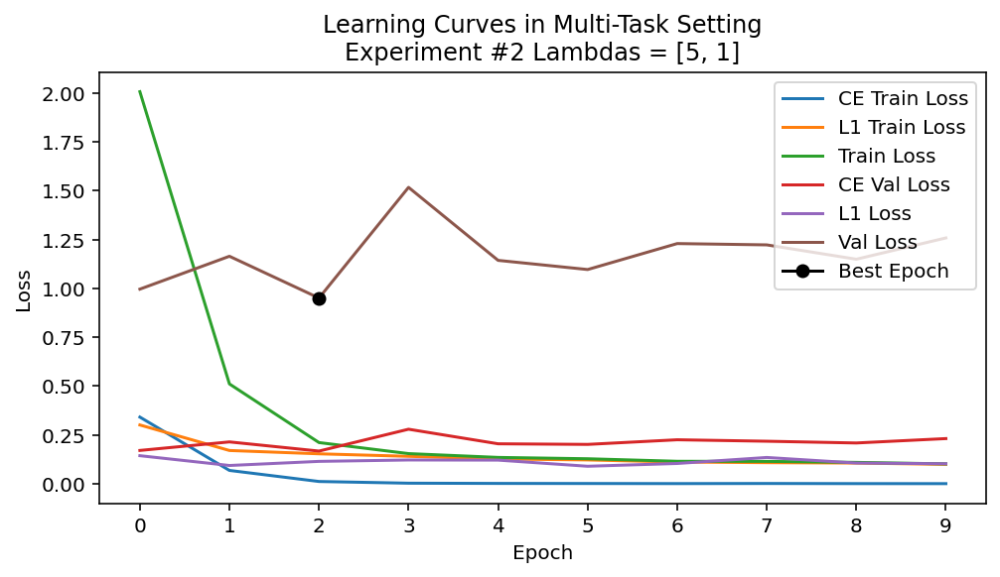

Training Setting
Multi-Task Setting
Experiment #3 Lambdas = [1, 20]


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.5081 | Train L1 0.1889  | Train Loss 4.2866 |  Val CEL 0.3719 | Val L1 0.0988 | Val Loss 2.3479 | Accuracy 0.956 | Recall 0.963 | Precision 0.952 | F1_score 0.955 | AUC_ROC 0.988 | L_eye_NME 43.920 | R_eye_NME 46.852 | nose_NME 69.636 | L_mouth_NME 67.538 | R_mouth_NME 80.133 | mean_NME 61.616 | std_NME 18.556 | FR(0.1) 0.987

Epoch [02/10]  Train CEL 0.2928 | Train L1 0.0931  | Train Loss 2.1550 |  Val CEL 0.2175 | Val L1 0.0420 | Val Loss 1.0575 | Accuracy 0.889 | Recall 1.000 | Precision 0.822 | F1_score 0.896 | AUC_ROC 1.000 | L_eye_NME 20.400 | R_eye_NME 24.433 | nose_NME 30.015 | L_mouth_NME 27.138 | R_mouth_NME 31.576 | mean_NME 26.712 | std_NME 8.593 | FR(0.1) 0.907

Epoch [03/10]  Train CEL 0.1862 | Train L1 0.0799  | Train Loss 1.7836 |  Val CEL 0.1456 | Val L1 0.0430 | Val Loss 1.0065 | Accuracy 0.978 | Recall 1.000 | Precision 0.952 | F1_score 0.974 | AUC_ROC 1.000 | L_eye_NME 18.921 | R_eye_NME 20.989 | nose_NME 33.684 | L_mouth_NME 32.741 | R_m

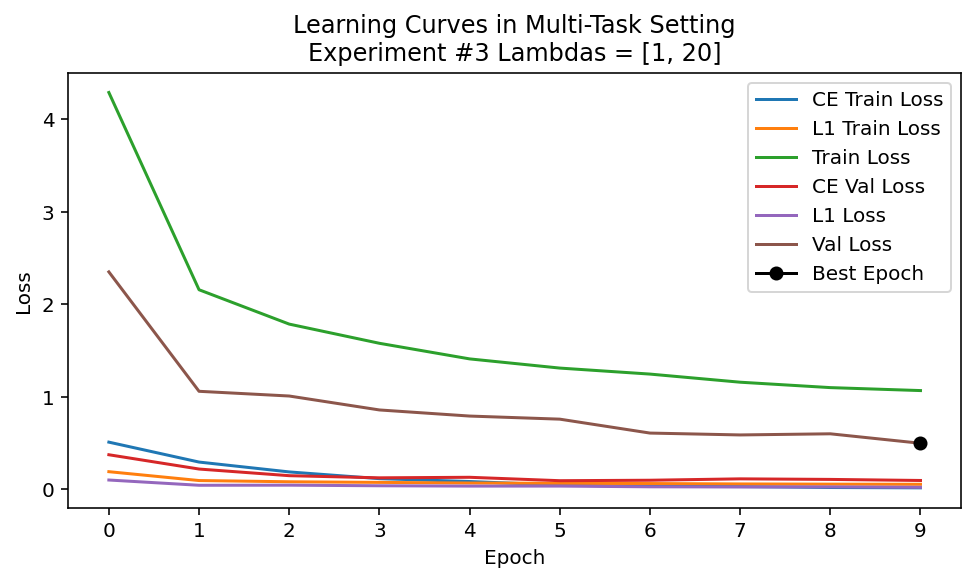

Training Setting
Multi-Task Setting
Experiment #4 Lambdas = [20, 1]


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.3415 | Train L1 0.2985  | Train Loss 7.1279 |  Val CEL 0.1274 | Val L1 0.1729 | Val Loss 2.7217 | Accuracy 0.933 | Recall 0.880 | Precision 0.963 | F1_score 0.915 | AUC_ROC 0.986 | L_eye_NME 72.528 | R_eye_NME 103.201 | nose_NME 117.560 | L_mouth_NME 122.440 | R_mouth_NME 128.577 | mean_NME 108.861 | std_NME 44.017 | FR(0.1) 1.000

Epoch [02/10]  Train CEL 0.0691 | Train L1 0.2259  | Train Loss 1.6073 |  Val CEL 0.1430 | Val L1 0.1424 | Val Loss 3.0016 | Accuracy 0.956 | Recall 1.000 | Precision 0.925 | F1_score 0.960 | AUC_ROC 0.994 | L_eye_NME 66.666 | R_eye_NME 110.443 | nose_NME 80.658 | L_mouth_NME 73.902 | R_mouth_NME 112.978 | mean_NME 88.929 | std_NME 32.001 | FR(0.1) 0.996

Epoch [03/10]  Train CEL 0.0322 | Train L1 0.1809  | Train Loss 0.8246 |  Val CEL 0.4710 | Val L1 0.1320 | Val Loss 9.5511 | Accuracy 0.867 | Recall 1.000 | Precision 0.785 | F1_score 0.877 | AUC_ROC 0.976 | L_eye_NME 65.349 | R_eye_NME 92.703 | nose_NME 89.345 | L_mouth_NME 73.9

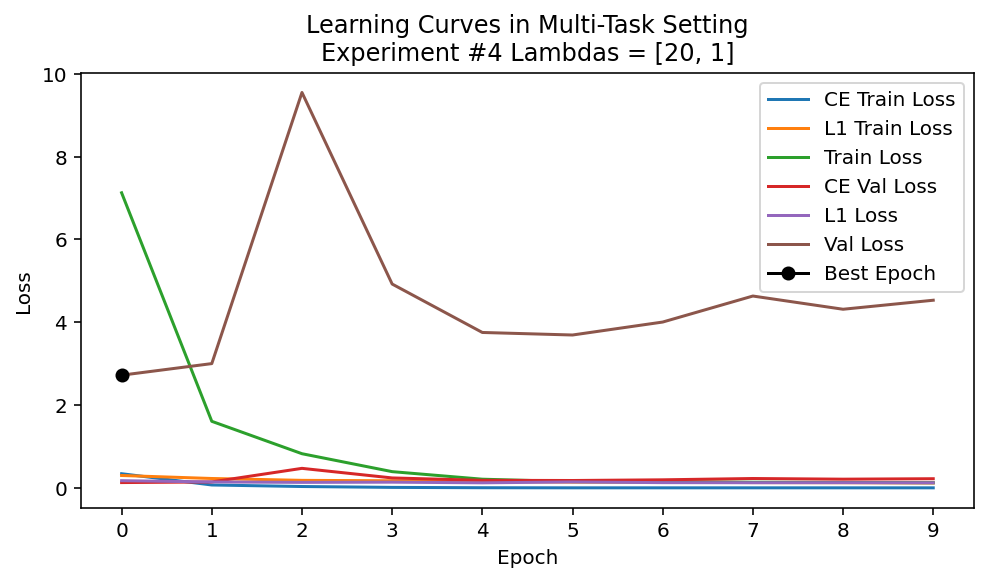

Training Setting
Multi-Task Setting
Experiment #5 Lambdas = [1, 50]


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.5273 | Train L1 0.1696  | Train Loss 9.0086 |  Val CEL 0.4309 | Val L1 0.0506 | Val Loss 2.9606 | Accuracy 0.844 | Recall 1.000 | Precision 0.741 | F1_score 0.843 | AUC_ROC 0.987 | L_eye_NME 30.784 | R_eye_NME 26.533 | nose_NME 31.861 | L_mouth_NME 34.376 | R_mouth_NME 36.644 | mean_NME 32.040 | std_NME 12.444 | FR(0.1) 0.929

Epoch [02/10]  Train CEL 0.3705 | Train L1 0.0915  | Train Loss 4.9453 |  Val CEL 0.2503 | Val L1 0.0626 | Val Loss 3.3825 | Accuracy 0.911 | Recall 1.000 | Precision 0.831 | F1_score 0.903 | AUC_ROC 1.000 | L_eye_NME 31.662 | R_eye_NME 34.444 | nose_NME 40.283 | L_mouth_NME 43.696 | R_mouth_NME 40.693 | mean_NME 38.156 | std_NME 9.922 | FR(0.1) 0.942

Epoch [03/10]  Train CEL 0.2728 | Train L1 0.0752  | Train Loss 4.0323 |  Val CEL 0.2291 | Val L1 0.0454 | Val Loss 2.5008 | Accuracy 0.911 | Recall 0.867 | Precision 1.000 | F1_score 0.917 | AUC_ROC 1.000 | L_eye_NME 28.161 | R_eye_NME 27.333 | nose_NME 29.997 | L_mouth_NME 28.193 | R_m

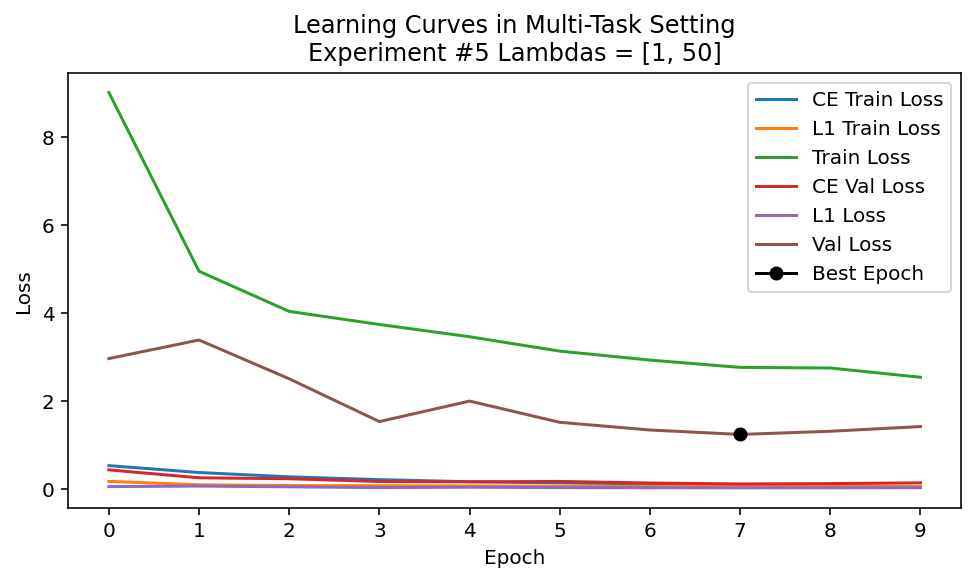

Training Setting
Multi-Task Setting
Experiment #6 Lambdas = [50, 1]


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.3793 | Train L1 0.3253  | Train Loss 19.2924 |  Val CEL 0.2003 | Val L1 0.1375 | Val Loss 10.1533 | Accuracy 0.933 | Recall 0.970 | Precision 0.914 | F1_score 0.939 | AUC_ROC 0.970 | L_eye_NME 70.493 | R_eye_NME 88.772 | nose_NME 90.924 | L_mouth_NME 85.559 | R_mouth_NME 103.193 | mean_NME 87.788 | std_NME 31.061 | FR(0.1) 1.000

Epoch [02/10]  Train CEL 0.1254 | Train L1 0.2106  | Train Loss 6.4805 |  Val CEL 0.1641 | Val L1 0.1654 | Val Loss 8.3718 | Accuracy 0.933 | Recall 0.903 | Precision 0.944 | F1_score 0.922 | AUC_ROC 0.988 | L_eye_NME 70.343 | R_eye_NME 108.242 | nose_NME 105.755 | L_mouth_NME 102.772 | R_mouth_NME 125.816 | mean_NME 102.586 | std_NME 32.804 | FR(0.1) 0.991

Epoch [03/10]  Train CEL 0.0572 | Train L1 0.1716  | Train Loss 3.0303 |  Val CEL 0.1494 | Val L1 0.1354 | Val Loss 7.6036 | Accuracy 0.933 | Recall 0.911 | Precision 0.958 | F1_score 0.930 | AUC_ROC 1.000 | L_eye_NME 71.110 | R_eye_NME 80.112 | nose_NME 76.717 | L_mouth_NME 95.

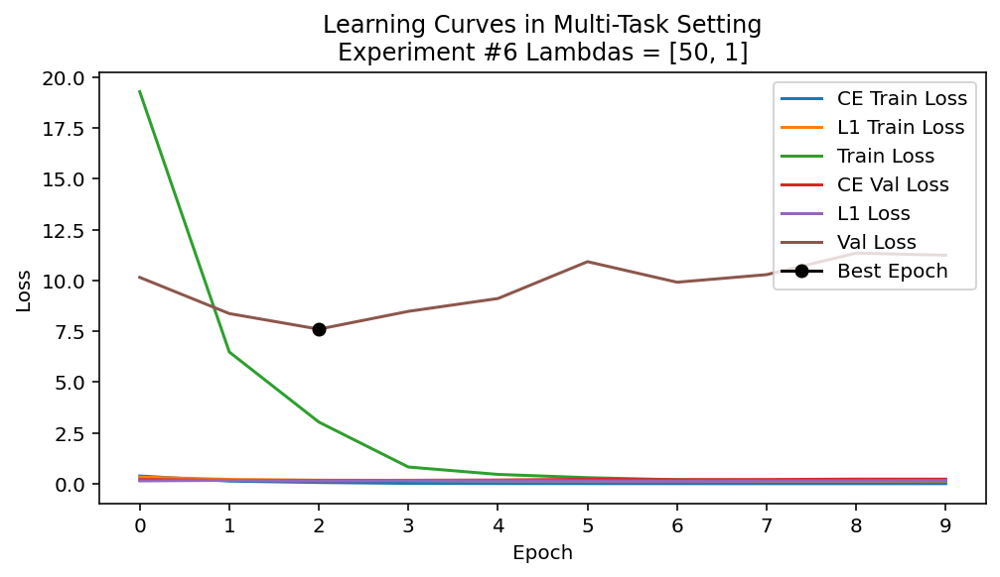

In [16]:
batch_size = 15
n_epochs = 10
learning_rate = 0.0001
# Get device, CUDA or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

lambds = [[1, 1], [1,5], [5,1], [1,20], [20,1], [1,50], [50,1]]

for c, lmds in enumerate(lambds):
    
    # Create Model 3
    model_3 = BaselineModel(task='multi_task').to(device)
    
    # From the best loss before
    loss_3 = [nn.CrossEntropyLoss(), nn.L1Loss()]
    
    trainer_3 = Trainer(train_set,
                        val_set,
                        batch_size,
                        n_epochs,
                        learning_rate,
                        model_3,
                        loss_3,
                        device,
                        opti='Adamax',
                        lmbds=lmds,
                        out_path=f"3_exp{c}",
                        tag=f"Multi-Task Setting\nExperiment #{c} Lambdas = {lmds}",
                        task='multi_task')

    for epoch in tqdm(range(n_epochs)):
      trainer_3.train(epoch)
      trainer_3.validation(epoch)

    trainer_3.plot_losses()

|           |           |           | Gender Classification |          |        |           |          |         | Landmarks Regression |                  |                |
|:---------:|:---------:|:---------:|:---------------------:|:--------:|:------:|:---------:|:--------:|:-------:|:--------------------:|:----------------:|:--------------:|
| lambda_1 | lambda_2 | Val. Loss |        CE Loss        | Accuracy | Recall | Precision | F1-Score | AUC ROC |        L1 Loss       |      NME (%)     | FR 0.1 (%) |
|     1     |     1     |   0.2108  |         0.1202        |   0.933  |  0.963 |   0.917   |   0.933  |  1.000  |        0.0906        |  56.726 ± 17.344 |      97.8      |
|     1     |     5     |   0.2145  |         0.0641        |   0.956  |  1.000 |   0.930   |   0.963  |  1.000  |        0.0301        |  18.739 ± 7.829  |      78.2      |
|     5     |     1     |   0.9504  |         0.1672        |   0.956  |  1.000 |   0.939   |   0.967  |  0.969  |        0.1144        |  71.032 ± 21.243 |      99.6      |
|     1     |     20    |   0.4960  |         0.0939        |   0.956  |  1.000 |   0.915   |   0.955  |  1.000  |        0.0201        |  12.863 ± 5.404  |      56.9      |
|     20    |     1     |   2.7217  |         0.1274        |   0.933  |  0.880 |   0.963   |   0.915  |  0.986  |        0.1729        | 108.861 ± 44.017 |       100      |

Looking at the final results, lambda_1 = 1 and lambda_2 = 20 seems to be the best balance. We will used it onwards. Let's download for delivery and test it.

In [17]:
FileLink('./3_exp3.pth')

/kaggle/working/3_exp3.pth

### Different dk values <a name="exp4"></a>
[(back to top)](#top)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Training Setting
Improvement Self-Attention
Experiment #0 dk = 32


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.6887 | Train L1 0.2829  | Train Loss 6.3475 |  Val CEL 0.6810 | Val L1 0.1349 | Val Loss 3.3795 | Accuracy 0.511 | Recall 0.000 | Precision 0.000 | F1_score 0.000 | AUC_ROC 0.902 | L_eye_NME 65.170 | R_eye_NME 86.674 | nose_NME 81.856 | L_mouth_NME 91.622 | R_mouth_NME 103.821 | mean_NME 85.829 | std_NME 14.234 | FR(0.1) 1.000

Epoch [02/10]  Train CEL 0.6633 | Train L1 0.1119  | Train Loss 2.9003 |  Val CEL 0.6253 | Val L1 0.0513 | Val Loss 1.6523 | Accuracy 0.844 | Recall 0.679 | Precision 1.000 | F1_score 0.793 | AUC_ROC 0.946 | L_eye_NME 36.251 | R_eye_NME 29.152 | nose_NME 38.837 | L_mouth_NME 30.996 | R_mouth_NME 32.867 | mean_NME 33.620 | std_NME 7.511 | FR(0.1) 0.929

Epoch [03/10]  Train CEL 0.5577 | Train L1 0.1001  | Train Loss 2.5593 |  Val CEL 0.4241 | Val L1 0.0837 | Val Loss 2.0988 | Accuracy 0.889 | Recall 1.000 | Precision 0.813 | F1_score 0.896 | AUC_ROC 0.964 | L_eye_NME 34.361 | R_eye_NME 45.021 | nose_NME 60.838 | L_mouth_NME 54.322 | R_

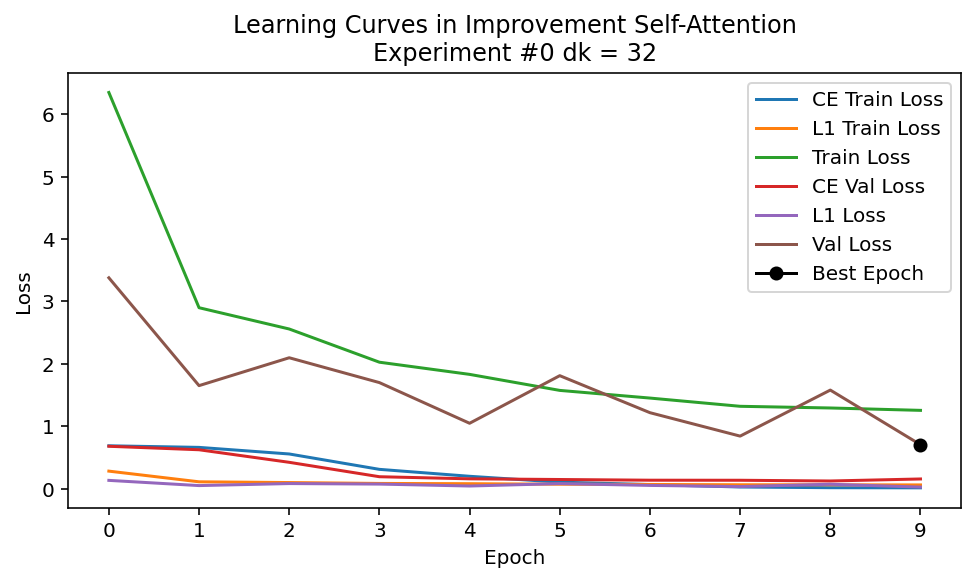

Training Setting
Improvement Self-Attention
Experiment #1 dk = 64


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.6788 | Train L1 0.2618  | Train Loss 5.9150 |  Val CEL 0.6523 | Val L1 0.0641 | Val Loss 1.9340 | Accuracy 0.933 | Recall 0.944 | Precision 0.903 | F1_score 0.922 | AUC_ROC 0.970 | L_eye_NME 30.813 | R_eye_NME 40.760 | nose_NME 39.387 | L_mouth_NME 58.065 | R_mouth_NME 42.221 | mean_NME 42.249 | std_NME 12.144 | FR(0.1) 0.938

Epoch [02/10]  Train CEL 0.6052 | Train L1 0.1129  | Train Loss 2.8634 |  Val CEL 0.5057 | Val L1 0.0621 | Val Loss 1.7479 | Accuracy 0.911 | Recall 0.952 | Precision 0.886 | F1_score 0.915 | AUC_ROC 0.970 | L_eye_NME 40.553 | R_eye_NME 27.489 | nose_NME 35.482 | L_mouth_NME 50.148 | R_mouth_NME 44.504 | mean_NME 39.635 | std_NME 9.740 | FR(0.1) 0.960

Epoch [03/10]  Train CEL 0.3702 | Train L1 0.0912  | Train Loss 2.1947 |  Val CEL 0.2469 | Val L1 0.0639 | Val Loss 1.5250 | Accuracy 0.911 | Recall 0.967 | Precision 0.852 | F1_score 0.896 | AUC_ROC 0.994 | L_eye_NME 35.011 | R_eye_NME 33.361 | nose_NME 40.809 | L_mouth_NME 47.270 | R_m

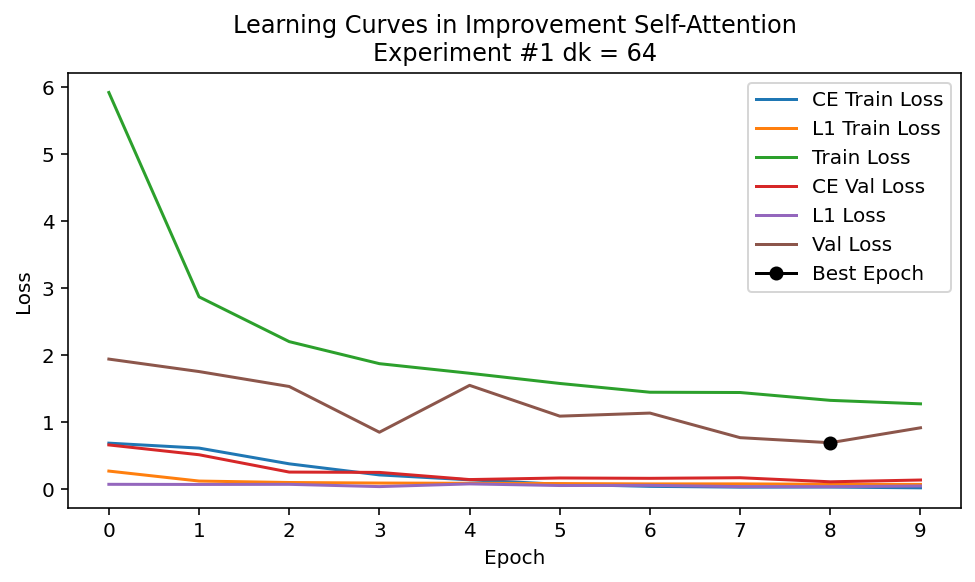

Training Setting
Improvement Self-Attention
Experiment #2 dk = 128


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.6207 | Train L1 0.1926  | Train Loss 4.4717 |  Val CEL 0.4325 | Val L1 0.0632 | Val Loss 1.6958 | Accuracy 0.911 | Recall 0.905 | Precision 0.939 | F1_score 0.911 | AUC_ROC 0.988 | L_eye_NME 49.267 | R_eye_NME 33.501 | nose_NME 29.404 | L_mouth_NME 38.110 | R_mouth_NME 41.451 | mean_NME 38.347 | std_NME 10.659 | FR(0.1) 0.924

Epoch [02/10]  Train CEL 0.3501 | Train L1 0.0907  | Train Loss 2.1645 |  Val CEL 0.2264 | Val L1 0.0399 | Val Loss 1.0239 | Accuracy 0.911 | Recall 1.000 | Precision 0.847 | F1_score 0.917 | AUC_ROC 0.982 | L_eye_NME 19.845 | R_eye_NME 28.182 | nose_NME 28.176 | L_mouth_NME 19.779 | R_mouth_NME 28.564 | mean_NME 24.909 | std_NME 10.078 | FR(0.1) 0.853

Epoch [03/10]  Train CEL 0.2071 | Train L1 0.0757  | Train Loss 1.7212 |  Val CEL 0.1293 | Val L1 0.0639 | Val Loss 1.4065 | Accuracy 0.956 | Recall 0.926 | Precision 1.000 | F1_score 0.958 | AUC_ROC 1.000 | L_eye_NME 33.829 | R_eye_NME 34.198 | nose_NME 43.271 | L_mouth_NME 41.978 | R_

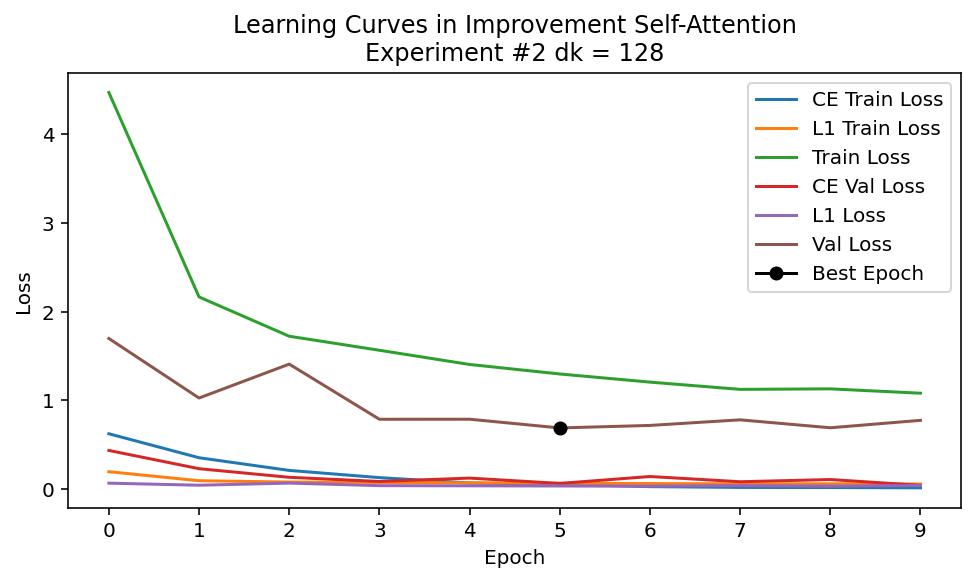

Training Setting
Improvement Self-Attention
Experiment #3 dk = 256


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.6626 | Train L1 0.2364  | Train Loss 5.3897 |  Val CEL 0.5648 | Val L1 0.0530 | Val Loss 1.6242 | Accuracy 0.889 | Recall 0.933 | Precision 0.850 | F1_score 0.886 | AUC_ROC 0.949 | L_eye_NME 26.083 | R_eye_NME 27.211 | nose_NME 35.840 | L_mouth_NME 37.471 | R_mouth_NME 38.535 | mean_NME 33.028 | std_NME 10.451 | FR(0.1) 0.876

Epoch [02/10]  Train CEL 0.4286 | Train L1 0.1161  | Train Loss 2.7502 |  Val CEL 0.2284 | Val L1 0.0822 | Val Loss 1.8727 | Accuracy 0.911 | Recall 0.952 | Precision 0.867 | F1_score 0.906 | AUC_ROC 0.987 | L_eye_NME 26.670 | R_eye_NME 54.300 | nose_NME 52.745 | L_mouth_NME 53.815 | R_mouth_NME 64.248 | mean_NME 50.356 | std_NME 14.232 | FR(0.1) 0.973

Epoch [03/10]  Train CEL 0.2069 | Train L1 0.1003  | Train Loss 2.2123 |  Val CEL 0.1671 | Val L1 0.0363 | Val Loss 0.8931 | Accuracy 0.933 | Recall 0.958 | Precision 0.917 | F1_score 0.930 | AUC_ROC 0.994 | L_eye_NME 16.245 | R_eye_NME 19.129 | nose_NME 26.198 | L_mouth_NME 29.776 | R_

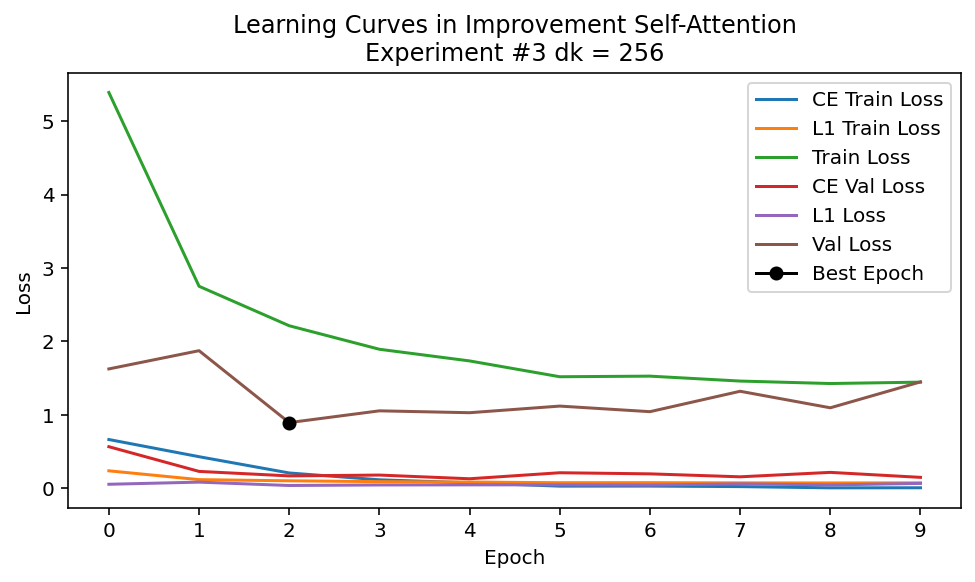

Training Setting
Improvement Self-Attention
Experiment #4 dk = 512


  0%|          | 0/10 [00:00<?, ?it/s]


Epoch [01/10]  Train CEL 0.5116 | Train L1 0.1951  | Train Loss 4.4132 |  Val CEL 0.2538 | Val L1 0.0825 | Val Loss 1.9039 | Accuracy 0.911 | Recall 0.963 | Precision 0.878 | F1_score 0.913 | AUC_ROC 0.970 | L_eye_NME 30.242 | R_eye_NME 61.991 | nose_NME 42.354 | L_mouth_NME 54.728 | R_mouth_NME 67.139 | mean_NME 51.291 | std_NME 15.894 | FR(0.1) 0.982

Epoch [02/10]  Train CEL 0.2209 | Train L1 0.1090  | Train Loss 2.4009 |  Val CEL 0.2073 | Val L1 0.0894 | Val Loss 1.9954 | Accuracy 0.911 | Recall 1.000 | Precision 0.829 | F1_score 0.904 | AUC_ROC 0.994 | L_eye_NME 30.183 | R_eye_NME 52.181 | nose_NME 62.465 | L_mouth_NME 53.790 | R_mouth_NME 70.329 | mean_NME 53.790 | std_NME 15.458 | FR(0.1) 0.973

Epoch [03/10]  Train CEL 0.1194 | Train L1 0.0954  | Train Loss 2.0273 |  Val CEL 0.1204 | Val L1 0.0729 | Val Loss 1.5792 | Accuracy 0.956 | Recall 0.952 | Precision 0.952 | F1_score 0.952 | AUC_ROC 0.988 | L_eye_NME 34.100 | R_eye_NME 45.433 | nose_NME 45.081 | L_mouth_NME 46.257 | R_

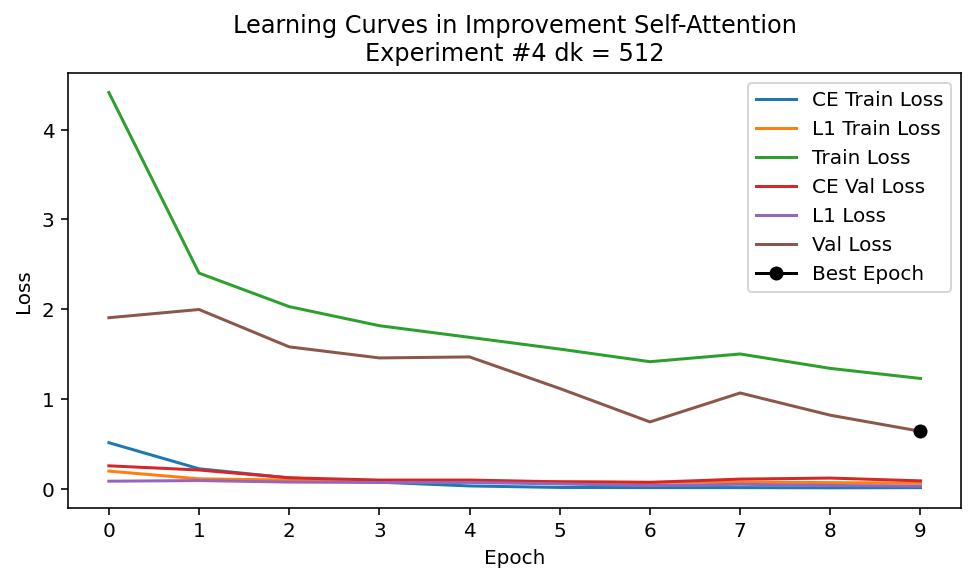

In [14]:
batch_size = 15
n_epochs = 10
learning_rate = 0.0001
# Get device, CUDA or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

dks = [32, 64, 128, 256, 512]

for c, d_k in enumerate(dks):
    
    # Create Model 4
    model_4 = MultiAttentionVGG(d_k).to(device)
    
    # From the best loss before
    loss_4 = [nn.CrossEntropyLoss(), nn.L1Loss()]
    
    trainer_4 = Trainer(train_set,
                        val_set,
                        batch_size,
                        n_epochs,
                        learning_rate,
                        model_4,
                        loss_4,
                        device,
                        opti='Adamax',
                        lmbds=[1,20],
                        out_path=f"4_exp{c}",
                        tag=f"Improvement Self-Attention\nExperiment #{c} dk = {d_k}",
                        task='multi_task')

    for epoch in tqdm(range(n_epochs)):
      trainer_4.train(epoch)
      trainer_4.validation(epoch)

    trainer_4.plot_losses()

|       |           | Gender Classification |          |        |           |          | Gender Classification | Landmarks Regression |              |                |
|:-----:|:---------:|:---------------------:|:--------:|:------:|:---------:|:--------:|:---------------------:|:--------------------:|:------------:|:--------------:|
| d_k | Val. Loss |      Val CE Loss      | Accuracy | Recall | Precision | F1-Score |        AUC ROC        |      Val L1 Loss     |    NME (%)   | FR 0.1 (%) |
|   32  |   0.7061  |         0.1574        |   0.956  |  1.000 |   0.921   |   0.958  |         0.994         |        0.0274        | 17.310 6.138 |      77.3      |
|   64  |   0.6853  |         0.1018        |   0.956  |  1.000 |   0.933   |   0.963  |         0.994         |        0.0292        | 18.540 7.789 |      72.0      |
|  128  |   0.6864  |         0.0601        |   0.978  |  0.967 |   1.000   |   0.982  |         1.000         |        0.0313        | 19.809 6.348 |      74.2      |
|  256  |   0.8931  |         0.1671        |   0.933  |  0.958 |   0.917   |   0.930  |         0.994         |        0.0363        | 23.346 7.838 |      77.3      |
|  512  |   0.6386  |         0.0862        |   0.933  |  0.967 |   0.903   |   0.930  |         0.993         |        0.0276        | 17.472 5.719 |      64.4      |

Looking at the final results, d_k = 512 to be the best balance. We will used it onwards.

### 50 Epochs Setting <a name="exp5"></a>
[(back to top)](#top)

Self-Attention Improvement

Training Setting
Improvement Self-Attention More Epochs
Experiment #0 dk = 512


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch [01/50]  Train CEL 0.5552 | Train L1 0.2010  | Train Loss 4.5759 |  Val CEL 0.3327 | Val L1 0.0606 | Val Loss 1.5445 | Accuracy 0.911 | Recall 0.844 | Precision 1.000 | F1_score 0.911 | AUC_ROC 0.980 | L_eye_NME 40.665 | R_eye_NME 40.729 | nose_NME 39.820 | L_mouth_NME 35.625 | R_mouth_NME 34.185 | mean_NME 38.205 | std_NME 8.870 | FR(0.1) 0.947

Epoch [02/50]  Train CEL 0.2392 | Train L1 0.1067  | Train Loss 2.3738 |  Val CEL 0.1904 | Val L1 0.0854 | Val Loss 1.8974 | Accuracy 0.911 | Recall 1.000 | Precision 0.852 | F1_score 0.917 | AUC_ROC 0.994 | L_eye_NME 35.588 | R_eye_NME 44.809 | nose_NME 48.407 | L_mouth_NME 67.767 | R_mouth_NME 69.945 | mean_NME 53.303 | std_NME 15.473 | FR(0.1) 0.991

Epoch [03/50]  Train CEL 0.1375 | Train L1 0.0974  | Train Loss 2.0847 |  Val CEL 0.1041 | Val L1 0.0381 | Val Loss 0.8652 | Accuracy 0.956 | Recall 0.926 | Precision 1.000 | F1_score 0.958 | AUC_ROC 1.000 | L_eye_NME 19.631 | R_eye_NME 16.692 | nose_NME 23.374 | L_mouth_NME 27.195 | R_m

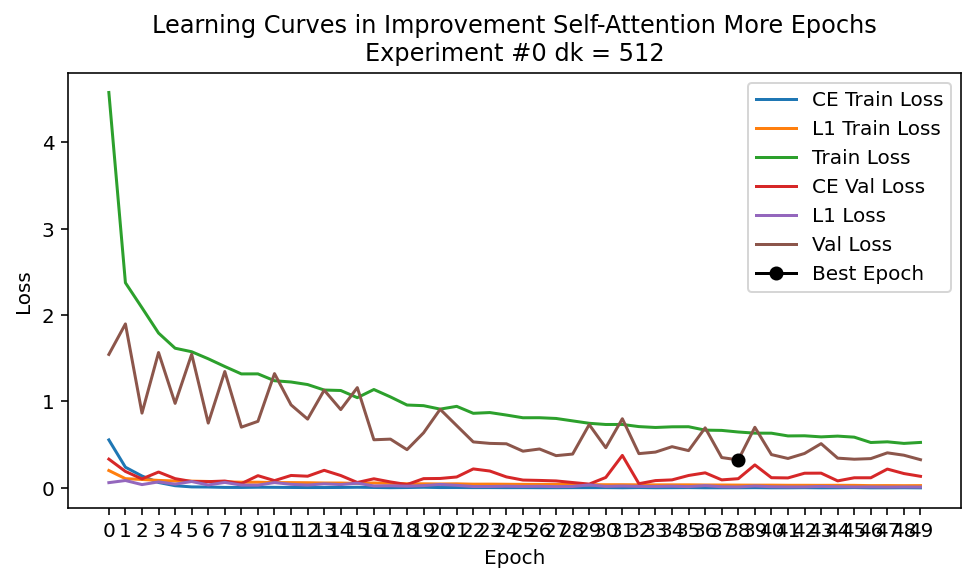

In [31]:
batch_size = 15
n_epochs = 50
learning_rate = 0.0001
# Get device, CUDA or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

d_k = 512
c = 0

# Create Model 5
model_5 = MultiAttentionVGG(d_k=512).to(device)

# From the best loss before
loss_5 = [nn.CrossEntropyLoss(), nn.L1Loss()]

trainer_5 = Trainer(train_set,
                val_set,
                batch_size,
                n_epochs,
                learning_rate,
                model_5,
                loss_5,
                device,
                opti='Adamax',
                lmbds=[1,20],
                out_path=f"4_self_attention",
                tag=f"Improvement Self-Attention More Epochs\nExperiment #{c} dk = {d_k}",
                task='multi_task')

for epoch in tqdm(range(n_epochs)):
    trainer_5.train(epoch)
    trainer_5.validation(epoch)

trainer_5.plot_losses()

In [24]:
FileLink('./4_self_attention.pth')

/kaggle/working/4_exp0.pth

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Training Setting
Multi-Task Setting More Epochs
Experiment #1 lambds = [1,20]


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch [01/50]  Train CEL 0.5457 | Train L1 0.1669  | Train Loss 3.8835 |  Val CEL 0.4201 | Val L1 0.0454 | Val Loss 1.3283 | Accuracy 0.844 | Recall 0.958 | Precision 0.773 | F1_score 0.848 | AUC_ROC 0.951 | L_eye_NME 24.798 | R_eye_NME 31.831 | nose_NME 26.880 | L_mouth_NME 31.562 | R_mouth_NME 32.087 | mean_NME 29.432 | std_NME 10.185 | FR(0.1) 0.924

Epoch [02/50]  Train CEL 0.3186 | Train L1 0.0897  | Train Loss 2.1126 |  Val CEL 0.2428 | Val L1 0.0347 | Val Loss 0.9376 | Accuracy 0.889 | Recall 1.000 | Precision 0.803 | F1_score 0.889 | AUC_ROC 0.969 | L_eye_NME 18.034 | R_eye_NME 21.007 | nose_NME 26.307 | L_mouth_NME 22.294 | R_mouth_NME 24.275 | mean_NME 22.383 | std_NME 8.519 | FR(0.1) 0.827

Epoch [03/50]  Train CEL 0.2044 | Train L1 0.0804  | Train Loss 1.8119 |  Val CEL 0.1844 | Val L1 0.0312 | Val Loss 0.8088 | Accuracy 0.956 | Recall 1.000 | Precision 0.905 | F1_score 0.944 | AUC_ROC 0.987 | L_eye_NME 15.807 | R_eye_NME 20.658 | nose_NME 22.047 | L_mouth_NME 20.214 | R_m

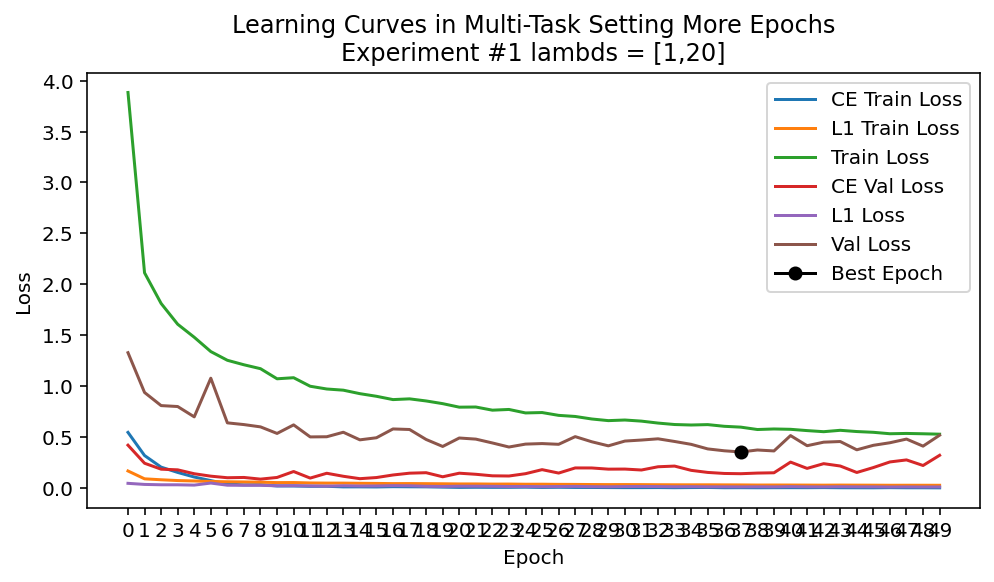

In [14]:
batch_size = 15
n_epochs = 50
learning_rate = 0.0001
# Get device, CUDA or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

c = 1

# Create Model 6
model_6 = BaselineModel(task='multi_task').to(device)

# From the best loss before
loss_6 = [nn.CrossEntropyLoss(), nn.L1Loss()]

trainer_6 = Trainer(train_set,
                val_set,
                batch_size,
                n_epochs,
                learning_rate,
                model_6,
                loss_6,
                device,
                opti='Adamax',
                lmbds=[1,20],
                out_path=f"4_exp{c}",
                tag=f"Multi-Task Setting More Epochs\nExperiment #{c} lambds = [1,20]",
                task='multi_task')

for epoch in tqdm(range(n_epochs)):
    trainer_6.train(epoch)
    trainer_6.validation(epoch)

trainer_6.plot_losses()

In [15]:
FileLink('./4_exp1.pth')

/kaggle/working/4_exp1.pth

Single-Task Landmarks Regression

Training Setting
Single-Task 2 Landmarks Regression More Epochs
Experiment #2 Loss = L1


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [01/50]  Train Loss 0.1654 | Val Loss 0.0555 | L_eye_NME 31.029 | R_eye_NME 33.428 | nose_NME 37.422 | L_mouth_NME 30.862 | R_mouth_NME 40.452 | mean_NME 34.639 | std_NME 10.608 | FR(0.1) 0.960
Epoch [02/50]  Train Loss 0.0834 | Val Loss 0.0349 | L_eye_NME 18.910 | R_eye_NME 18.272 | nose_NME 24.618 | L_mouth_NME 21.818 | R_mouth_NME 25.711 | mean_NME 21.866 | std_NME 9.277 | FR(0.1) 0.822
Epoch [03/50]  Train Loss 0.0726 | Val Loss 0.0267 | L_eye_NME 14.070 | R_eye_NME 13.900 | nose_NME 22.574 | L_mouth_NME 16.789 | R_mouth_NME 18.379 | mean_NME 17.142 | std_NME 6.370 | FR(0.1) 0.769
Epoch [04/50]  Train Loss 0.0652 | Val Loss 0.0285 | L_eye_NME 17.401 | R_eye_NME 12.052 | nose_NME 25.350 | L_mouth_NME 16.338 | R_mouth_NME 19.384 | mean_NME 18.105 | std_NME 7.175 | FR(0.1) 0.796
Epoch [05/50]  Train Loss 0.0595 | Val Loss 0.0335 | L_eye_NME 13.846 | R_eye_NME 27.024 | nose_NME 25.741 | L_mouth_NME 18.474 | R_mouth_NME 21.605 | mean_NME 21.338 | std_NME 7.178 | FR(0.1) 0.818
Epoc

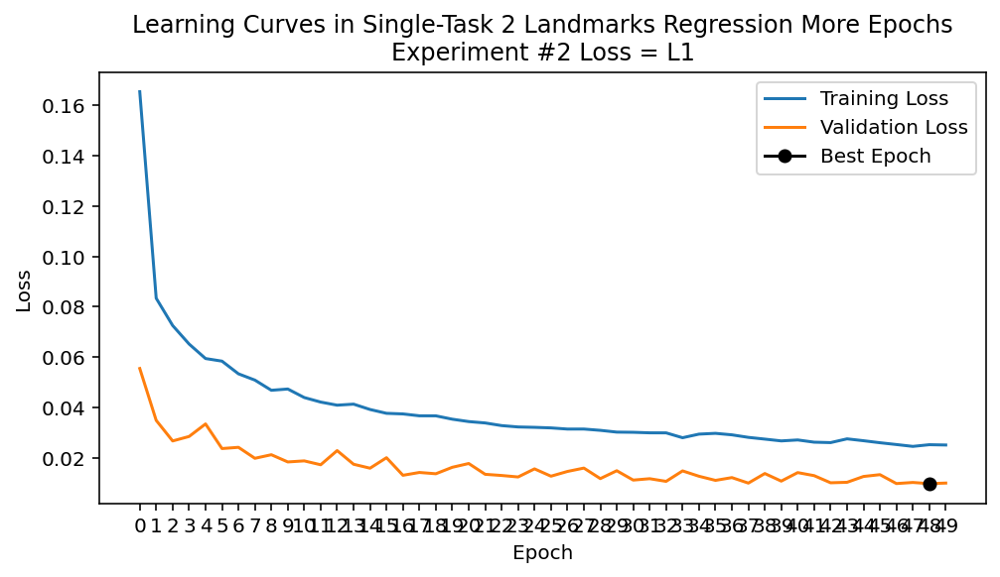

In [17]:
batch_size = 15
n_epochs = 50
learning_rate = 0.0001
# Get device, CUDA or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

c = 2

# Create Model 7
model_7 = BaselineModel(task='landmarks').to(device)

# From the best loss before
loss_7 = nn.L1Loss()

trainer_7 = Trainer(train_set,
                val_set,
                batch_size,
                n_epochs,
                learning_rate,
                model_7,
                loss_7,
                device,
                opti='Adamax',
                out_path=f"4_exp{c}",
                tag=f"Single-Task 2 Landmarks Regression More Epochs\nExperiment #{c} Loss = L1",
                task='landmarks')

for epoch in tqdm(range(n_epochs)):
    trainer_7.train(epoch)
    trainer_7.validation(epoch)

trainer_7.plot_losses()

In [18]:
FileLink('./4_exp2.pth')

/kaggle/working/4_exp2.pth

|                                  |           | Gender Classification |          |        |           |          |  | Landmarks Regression |               |                |
|:--------------------------------:|:---------:|:---------------------:|:--------:|:------:|:---------:|:--------:|:---------------------:|:--------------------:|:-------------:|:--------------:|
|               Model              | Val. Loss |      Val CE Loss      | Accuracy | Recall | Precision | F1-Score |        AUC ROC        |      Val L1 Loss     |    NME (%)    | FR 0.1 (%) |
| Single-Task Landmarks Regression |   0.0098  |           -           |     -    |    -   |     -     |     -    |           -           |        0.0098        | 6.417 ± 3.795 |      16.0      |
|        Multi-Task Setting        |   0.3532  |         0.1399        |   0.911  |  0.841 |   0.933   |   0.883  |         0.982         |        0.0111        | 7.239 ± 3.620 |      20.4      |
|    Improvement Self-Attention    |   0.3238  |         0.1064        |   0.956  |  1.000 |   0.897   |   0.944  |         0.993         |        0.0109        | 7.129 ± 3.552 |      18.7      |

## 📝 Final Testing<a name="testing"></a>
### Single-task 1 - Gender classification <a name="test1"></a>
[(back to top)](#top)

Testing Setting
Single-task 1 Gender Classification

[Full Test]	Accuracy 0.9600	Recall 0.9600	Precision 0.9600	F1_score 0.9600	AUC_ROC 0.9984
Inference Time = 4.7134488503138225 ms




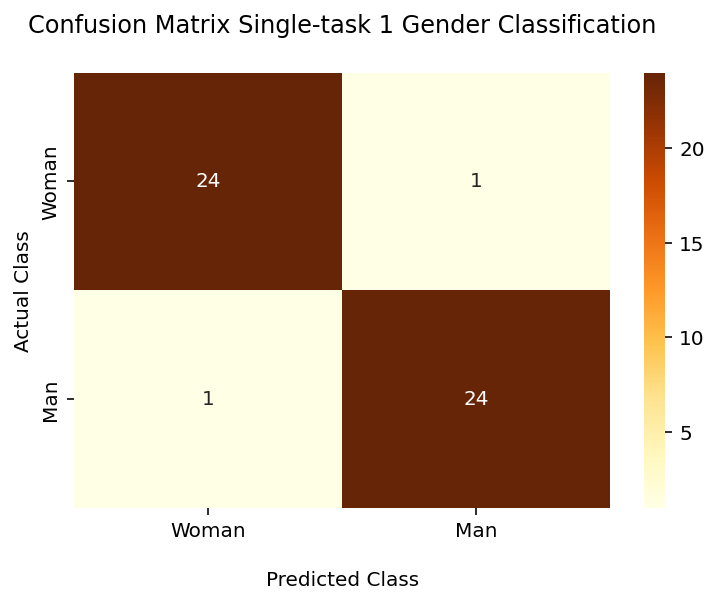

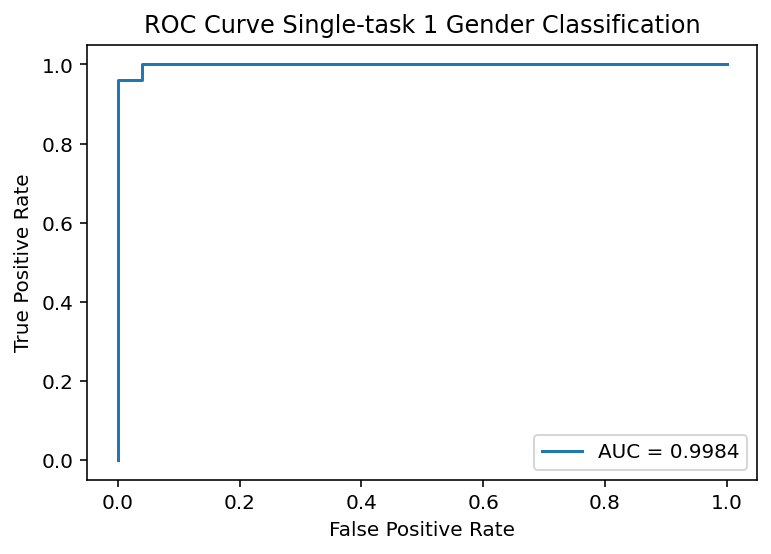

Poorly Classified Examples on top and Well Classified Examples on bottom


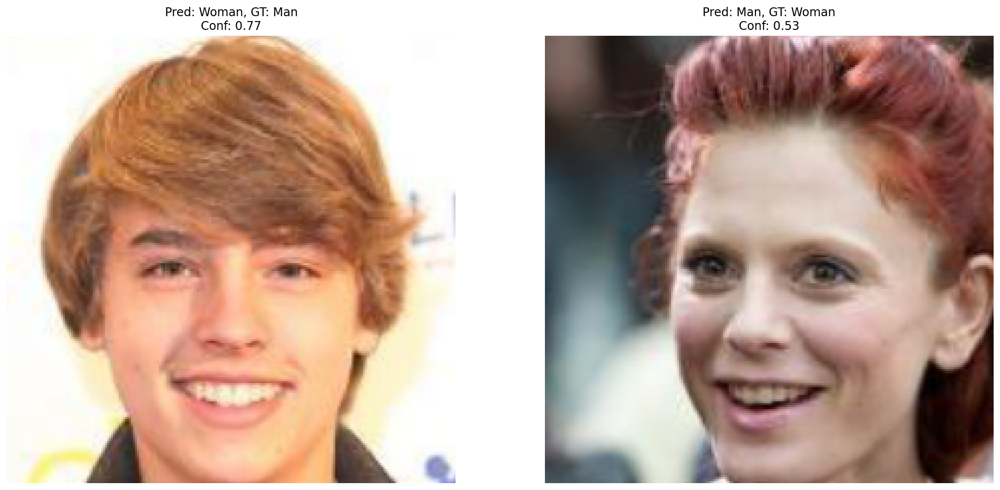

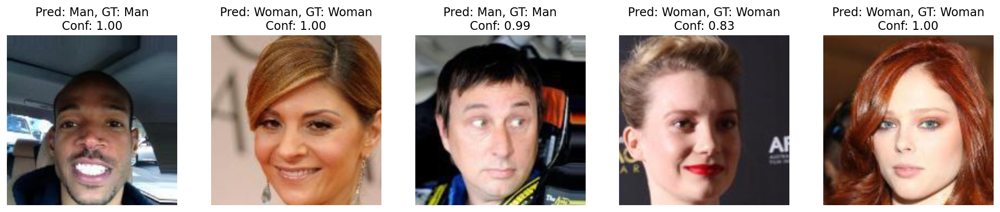

In [26]:
model_1 = BaselineModel(task='gender')
# Load OUR pretrained model
model_1.load_state_dict(torch.load('../input/celeba-mini/Project/weights/1_gender.pth'))

tester_1 = Tester(test_set,
                  model_1,
                  device,
                  tag='Single-task 1 Gender Classification',
                  task='gender')

tester_1.test()
inference_time(model_1)
tester_1.plot_conf_matrix()
tester_1.plot_roc_curve()
tester_1.plot_examples(invTrans)


### Single-task 2 - Face Landmarks Regression <a name="test2"></a>
[(back to top)](#top)

Testing Setting
Single-Task More Epochs
Loss = L1

[Full Test]	L_eye_NME 3.8446	R_eye_NME 4.3527	nose_NME 10.8417	L_mouth_NME 6.5682	R_mouth_NME 5.7020	mean_NME 6.2618	std_NME 3.5099	FR(0.1) 0.1760
Inference Time = 4.7523049513498945 ms


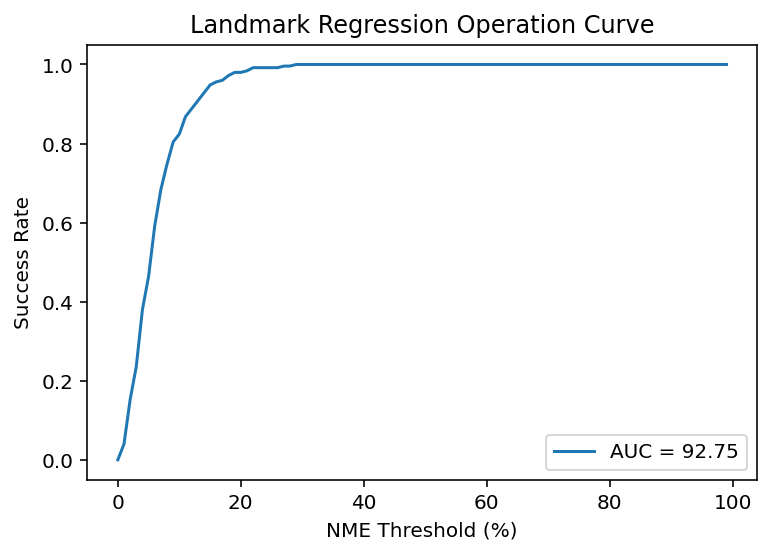

In [27]:
model_7 = BaselineModel(task='landmarks').to(device)
# Load OUR pretrained model
model_7.load_state_dict(torch.load('../input/celeba-mini/Project/weights/2_landmarks.pth'))

tester_7 = Tester(test_set,
                  model_7,
                  device,
                  tag='Single-Task More Epochs\nLoss = L1',
                  task='landmarks')

tester_7.test()
inference_time(model_7)
tester_7.plot_reg_curve()

### Multi-Task Setting<a name="test3"></a>
[(back to top)](#top)

Testing Setting
Multi-Task Setting More Epochs
lambdas = [1,20]

[Full Test]	Accuracy 0.9400	Recall 0.9200	Precision 0.9583	F1_score 0.9388	AUC_ROC 0.9920	L_eye_NME 4.7879	R_eye_NME 3.9039	nose_NME 10.2840	L_mouth_NME 5.7961	R_mouth_NME 7.1290	mean_NME 6.3802	std_NME 3.2614	FR(0.1) 0.1760
Inference Time = 5.676401062011719 ms




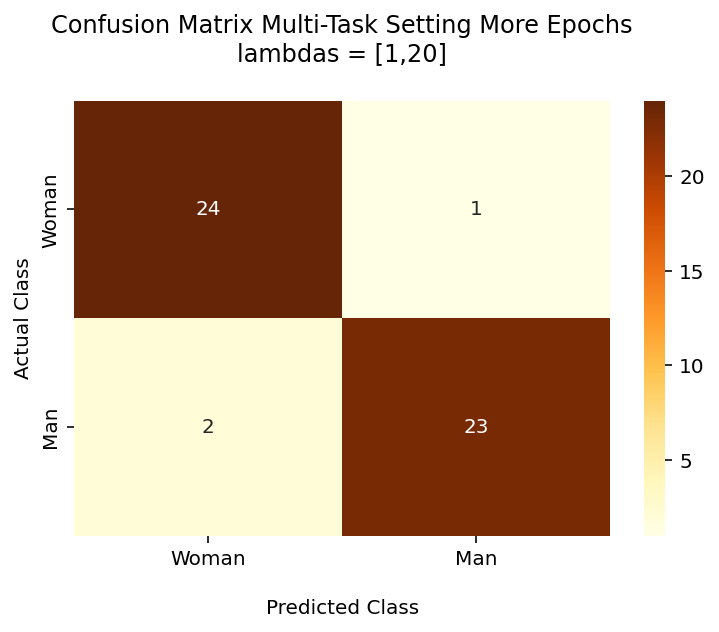

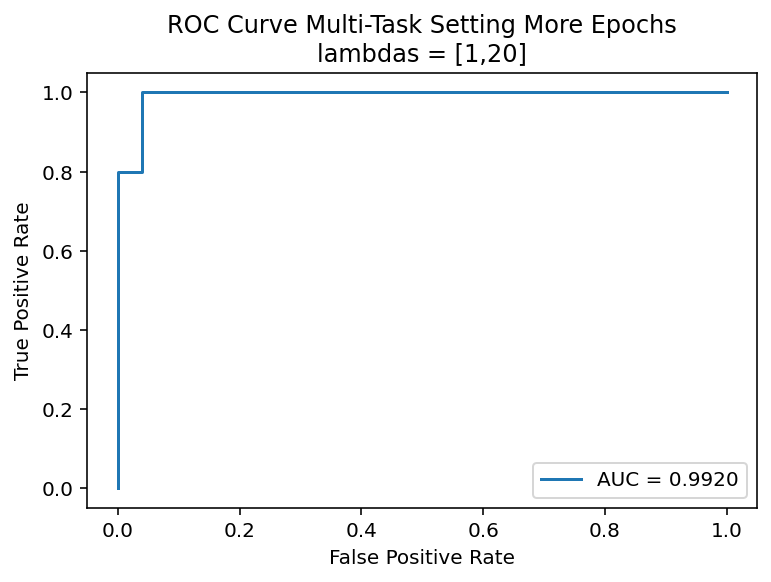

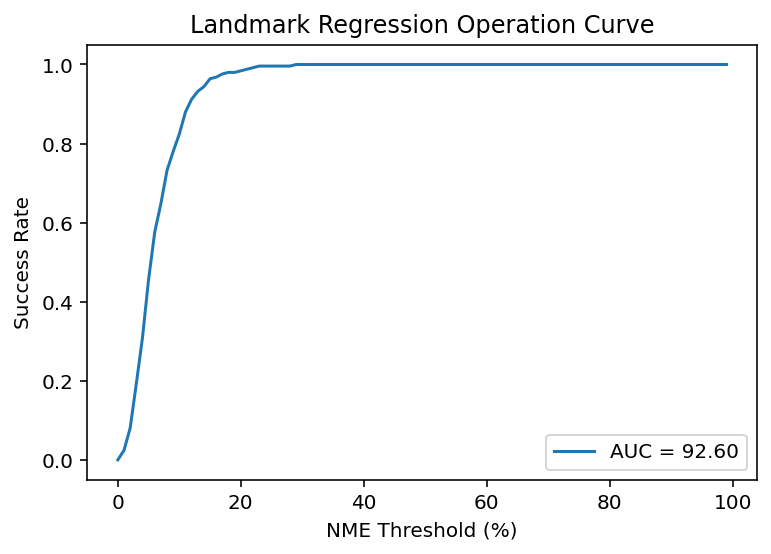

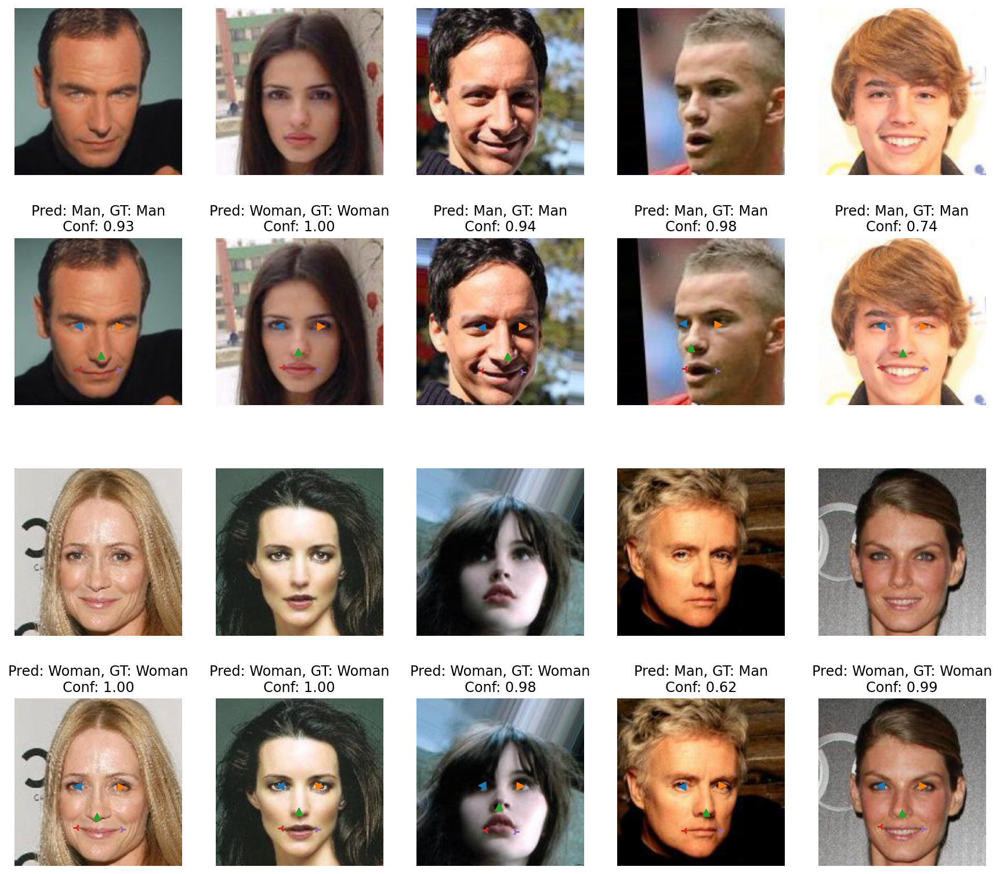

In [36]:
model_6 = BaselineModel(task='multi_task').to(device)
# Load OUR pretrained model
model_6.load_state_dict(torch.load('../input/celeba-mini/Project/weights/3_multi_task.pth'))

tester_6 = Tester(test_set,
                  model_6,
                  device,
                  tag='Multi-Task Setting More Epochs\nlambdas = [1,20]',
                  task='multi_task')

tester_6.test()
inference_time(model_6)
tester_6.plot_conf_matrix()
tester_6.plot_roc_curve()
tester_6.plot_reg_curve()
tester_6.plot_examples(invTrans)

### Improvement Self-Attention <a name="test4"></a>
[(back to top)](#top)

Testing Setting
Improvement Self-Attention More Epochs
d_k = 512

[Full Test]	Accuracy 0.9600	Recall 1.0000	Precision 0.9259	F1_score 0.9615	AUC_ROC 0.9952	L_eye_NME 4.7178	R_eye_NME 5.7135	nose_NME 12.0043	L_mouth_NME 6.8188	R_mouth_NME 7.3249	mean_NME 7.3158	std_NME 3.8830	FR(0.1) 0.2000
Inference Time = 5.8463303454717 ms




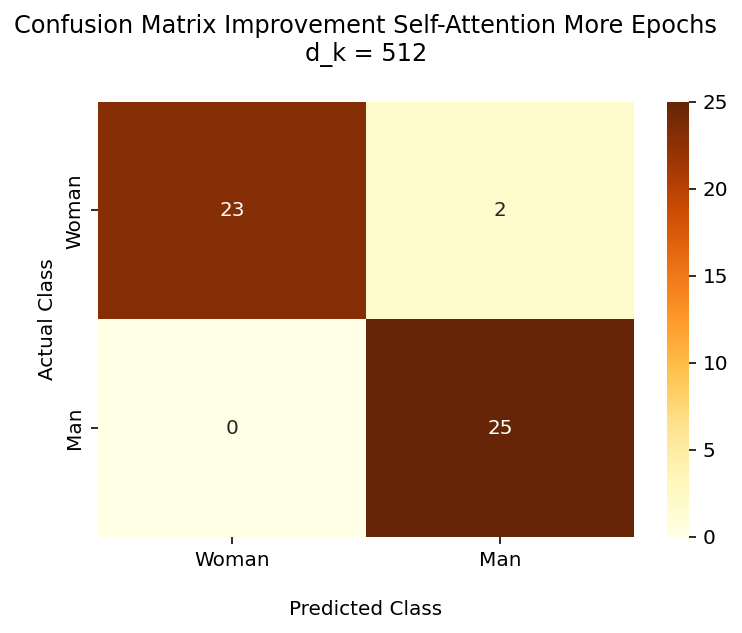

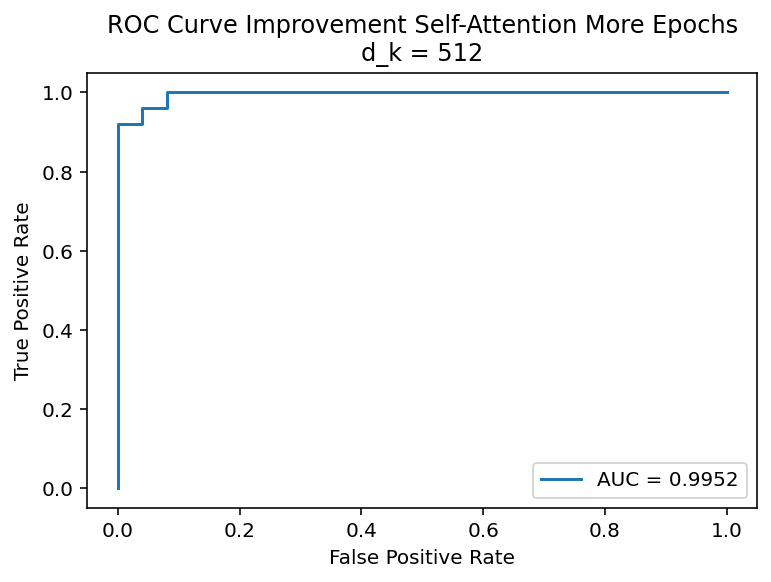

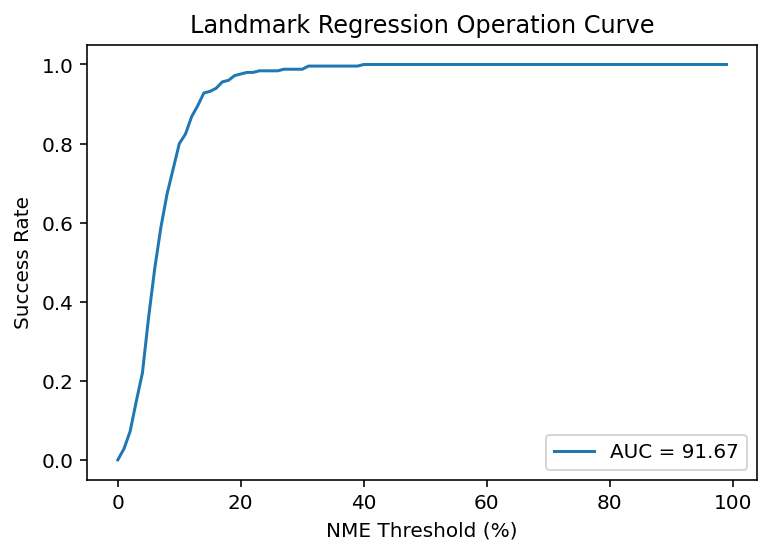

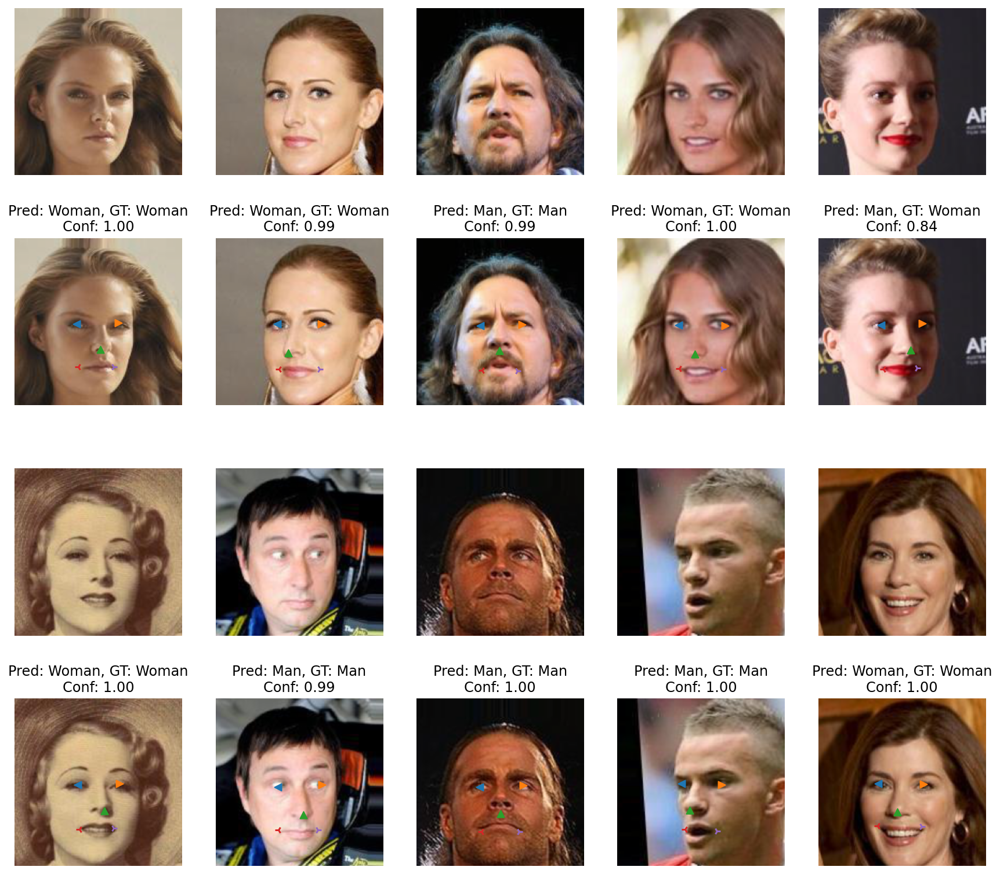

In [35]:
model_5 = MultiAttentionVGG(d_k=512).to(device)
# Load OUR pretrained model
model_5.load_state_dict(torch.load('./4_self_attention.pth'))

tester_5 = Tester(test_set,
                  model_5,
                  device,
                  tag='Improvement Self-Attention More Epochs\nd_k = 512',
                  task='multi_task')

tester_5.test()
inference_time(model_5)
tester_5.plot_conf_matrix()
tester_5.plot_roc_curve()
tester_5.plot_reg_curve()
tester_5.plot_examples(invTrans)

|       |   |        |           | Gender Classification |         |   | Landmarks Regression |        |                     |
|:-----:|:----------------------:|:------:|:---------:|:---------------------:|:-------:|:---------------------:|:--------------------:|--------|---------------------|
| Model |        Accuracy        | Recall | Precision |        F1-Score       | AUC ROC |        NME (%)        |    $FR_{0.1}$ (%)    | AUC    | Inference Time (ms) |
|   1   |         0.9600         | 0.9600 |   0.9600  |         0.9600        |  0.9984 |           -           |           -          | -      | 4.7134              |
|   2   |            -           |    -   |     -     |           -           |    -    |     6.2618 3.5099     |         17.6         | 0.9275 | 4.7523              |
|   3   |         0.9400         | 0.9200 |   0.9583  |         0.9388        |  0.9920 |     6.3802 3.2614     |         17.6         | 0.9260 | 5.6764              |
|   4   |         0.9600         |  1.000 |   0.9259  |         0.9615        |  0.9952 |     7.2158 3.8830     |          20.0         | 91.67  | 5.8463              |

[(back to top)](#top)